**Swin Factorizer, FedAdam**

**Imports & Drive Mount**

In [55]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [56]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
# from monai.networks.nets import UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [57]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [58]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [59]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints"
log_dir = "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs"

Checkpoints will be saved to: D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints
TensorBoard logs will be saved to: D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_logs
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6008 (pid 14040), started 6 days, 16:47:12 ago. (Use '!kill 14040' to kill it.)

In [60]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [61]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [62]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [63]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


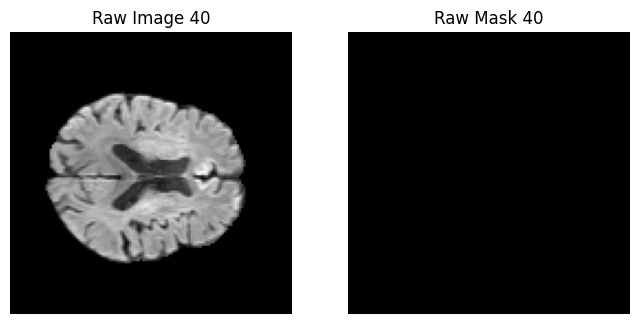

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


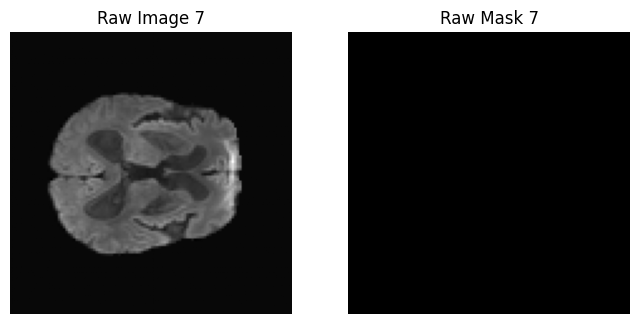

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


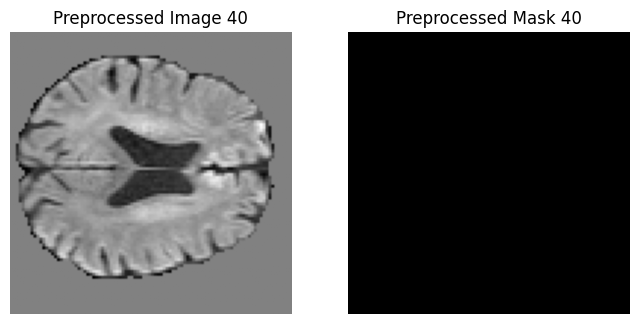

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


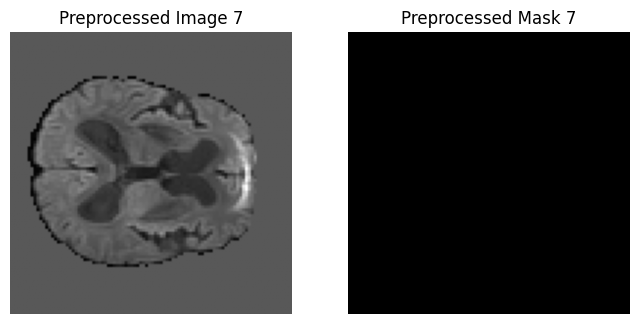

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


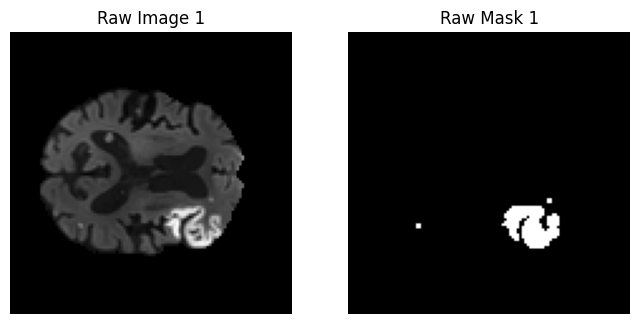

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


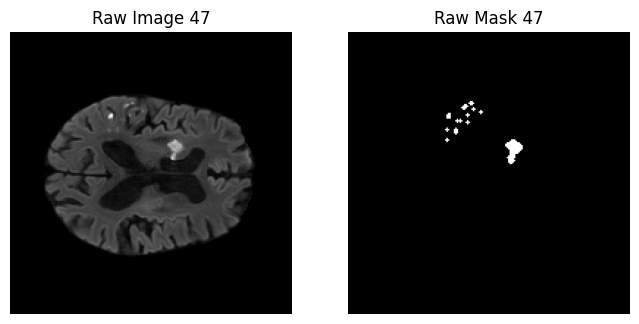

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


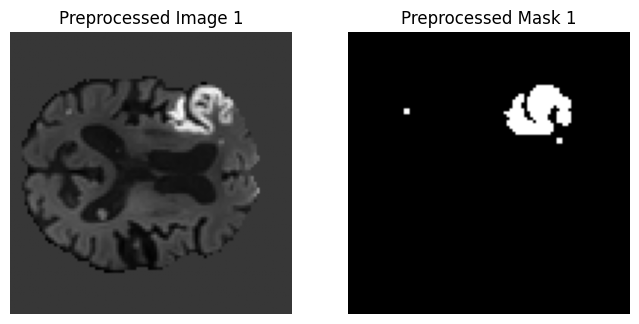

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


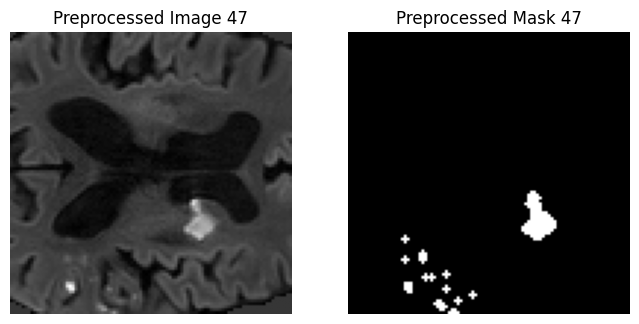

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


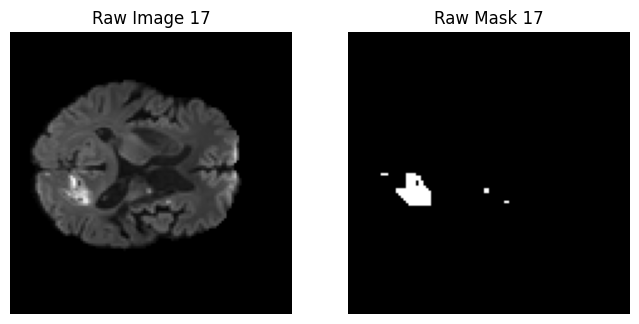

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


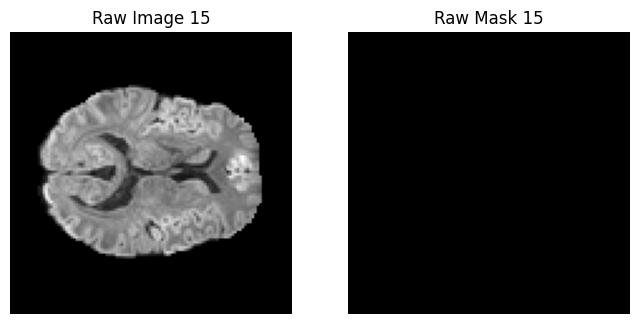

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


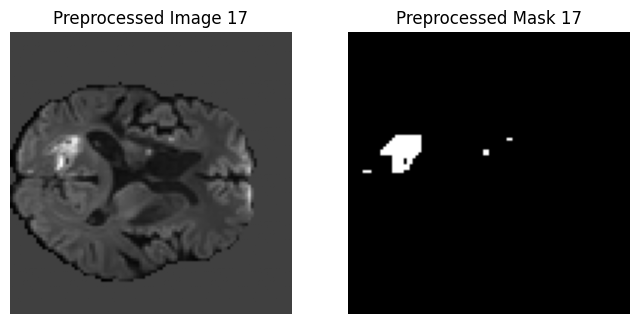

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


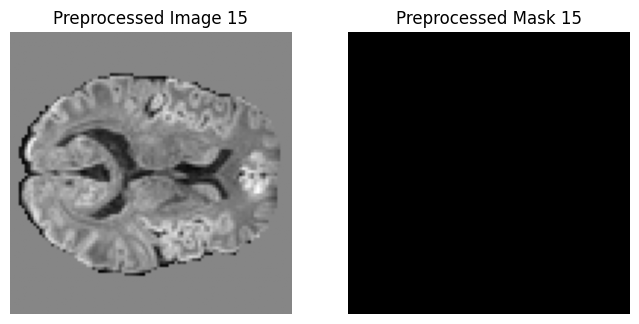

Client 2 samples: 50


In [64]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)
        
        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [65]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


Swin Factorizer

In [66]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [67]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


In [68]:
!pip install git+https://github.com/pashtari/factorizer.git

  Cloning https://github.com/pashtari/factorizer.git to C:\Users\LAB\AppData\Local\Temp\pip-req-build-kv0_sncf
  Resolved https://github.com/pashtari/factorizer.git to commit 9adcc5d3c5178d458f5720125ce450e7696f1e09
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'


  Running command git clone --filter=blob:none --quiet https://github.com/pashtari/factorizer.git 'C:\Users\LAB\AppData\Local\Temp\pip-req-build-kv0_sncf'


In [69]:
import factorizer as ft

In [70]:
def create_model():
    model = ft.Factorizer(
        in_channels=1,
        out_channels=1,
        spatial_size=target_shape,
        encoder_depth=(1, 1, 1, 1),
        encoder_width=(32, 64, 128, 256),
        strides=(1, 2, 2, 2, 2),
        decoder_depth=(1, 1, 1, 1),
        norm=ft.LayerNorm,
        reshape=(ft.SWMatricize, {'head_dim': 8, 'patch_size': 2}),
        act=nn.ReLU,
        factorize=ft.NMF, 
        rank=1,
        num_iters=3,
        init="uniform",
        solver="hals",
        mlp_ratio=2,
        dropout=0.1
    ).to(device)
    print(model)
    return model

**Client Class**

In [71]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0
        
        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0 
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [72]:
class Server:
    def __init__(self, val_loader, device, lr=1e-3, beta1=0.9, beta2=0.999, eps=1e-8):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader
        
        # FedAdam
        self.lr = lr
        self.beta1 = beta1
        self.beta2 = beta2
        self.eps = eps

        # Adam states
        self.m = {}
        self.v = {}

        for k, v in self.global_model.state_dict().items():
            if v.dtype != torch.long:
                self.m[k] = torch.zeros_like(v)
                self.v[k] = torch.zeros_like(v)
                
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)
        
    def aggregate(self, client_params_list):

        global_params = self.global_model.state_dict()

        # Step 1: compute FedAvg weights
        avg_params = copy.deepcopy(client_params_list[0])

        for key in avg_params.keys():
            for i in range(1, len(client_params_list)):
                avg_params[key] += client_params_list[i][key]
            avg_params[key] /= len(client_params_list)

        # Step 2: compute delta
        new_params = {}

        for key in global_params.keys():

            # skip integer tensors (like num_batches_tracked)
            if global_params[key].dtype == torch.long:
                new_params[key] = global_params[key]
                continue
            
            avg_param = avg_params[key].to(self.device)
            
            delta = avg_param - global_params[key]

            # Adam momentum
            self.m[key] = self.beta1 * self.m[key] + (1 - self.beta1) * delta
            self.v[key] = self.beta2 * self.v[key] + (1 - self.beta2) * (delta ** 2)

            update = self.lr * self.m[key] / (torch.sqrt(self.v[key]) + self.eps)

            new_params[key] = global_params[key] + update

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0 
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [73]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)
                

**Federated Training loop**

In [74]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2  # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")
    
        # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------
    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8172 | Dice: 0.1599 | IoU: 0.0869 | HD95: 39.4483


Client 0 | Epoch 2/20 | Loss: 0.6738 | Dice: 0.1352 | IoU: 0.0725 | HD95: 32.2001


Client 0 | Epoch 3/20 | Loss: 0.5985 | Dice: 0.1671 | IoU: 0.0912 | HD95: 30.7373


Client 0 | Epoch 4/20 | Loss: 0.5816 | Dice: 0.1914 | IoU: 0.1058 | HD95: 31.5229


Client 0 | Epoch 5/20 | Loss: 0.5608 | Dice: 0.2228 | IoU: 0.1254 | HD95: 30.2334


Client 0 | Epoch 6/20 | Loss: 0.5410 | Dice: 0.2524 | IoU: 0.1444 | HD95: 32.1453


Client 0 | Epoch 7/20 | Loss: 0.5296 | Dice: 0.2686 | IoU: 0.1552 | HD95: 32.1468


Client 0 | Epoch 8/20 | Loss: 0.5165 | Dice: 0.2877 | IoU: 0.1680 | HD95: 33.2585


Client 0 | Epoch 9/20 | Loss: 0.5120 | Dice: 0.2941 | IoU: 0.1724 | HD95: 32.9540


Client 0 | Epoch 10/20 | Loss: 0.4952 | Dice: 0.3204 | IoU: 0.1908 | HD95: 32.1703


Client 0 | Epoch 11/20 | Loss: 0.4842 | Dice: 0.3331 | IoU: 0.1998 | HD95: 31.6797


Client 0 | Epoch 12/20 | Loss: 0.4932 | Dice: 0.3262 | IoU: 0.1949 | HD95: 31.3530


Client 0 | Epoch 13/20 | Loss: 0.4728 | Dice: 0.3522 | IoU: 0.2137 | HD95: 31.9698


Client 0 | Epoch 14/20 | Loss: 0.4486 | Dice: 0.3857 | IoU: 0.2389 | HD95: 31.2148


Client 0 | Epoch 15/20 | Loss: 0.4306 | Dice: 0.4079 | IoU: 0.2562 | HD95: 26.8215


Client 0 | Epoch 16/20 | Loss: 0.4130 | Dice: 0.4391 | IoU: 0.2813 | HD95: 24.2750


Client 0 | Epoch 17/20 | Loss: 0.4045 | Dice: 0.4488 | IoU: 0.2893 | HD95: 27.6802


Client 0 | Epoch 18/20 | Loss: 0.3531 | Dice: 0.5249 | IoU: 0.3559 | HD95: 21.8412


Client 0 | Epoch 19/20 | Loss: 0.3672 | Dice: 0.5017 | IoU: 0.3349 | HD95: 24.2050


Clients Training:  33%|███▎      | 1/3 [10:12<20:24, 612.50s/it]

Client 0 | Epoch 20/20 | Loss: 0.3420 | Dice: 0.5375 | IoU: 0.3675 | HD95: 19.7070
Client 0 | Loss=0.5018 | Dice=0.5375 | IoU=0.3675 | HD95=19.7070


Client 1 | Epoch 1/20 | Loss: 0.8163 | Dice: 0.1215 | IoU: 0.0647 | HD95: 38.2816


Client 1 | Epoch 2/20 | Loss: 0.6719 | Dice: 0.1313 | IoU: 0.0702 | HD95: 31.7590


Client 1 | Epoch 3/20 | Loss: 0.5877 | Dice: 0.1728 | IoU: 0.0946 | HD95: 32.3256


Client 1 | Epoch 4/20 | Loss: 0.5751 | Dice: 0.1911 | IoU: 0.1057 | HD95: 31.6475


Client 1 | Epoch 5/20 | Loss: 0.5409 | Dice: 0.2440 | IoU: 0.1390 | HD95: 32.1504


Client 1 | Epoch 6/20 | Loss: 0.5203 | Dice: 0.2714 | IoU: 0.1570 | HD95: 32.1710


Client 1 | Epoch 7/20 | Loss: 0.5108 | Dice: 0.2866 | IoU: 0.1673 | HD95: 32.1884


Client 1 | Epoch 8/20 | Loss: 0.5013 | Dice: 0.3033 | IoU: 0.1787 | HD95: 32.6830


Client 1 | Epoch 9/20 | Loss: 0.4957 | Dice: 0.3081 | IoU: 0.1821 | HD95: 32.6777


Client 1 | Epoch 10/20 | Loss: 0.4939 | Dice: 0.3122 | IoU: 0.1850 | HD95: 32.1407


Client 1 | Epoch 11/20 | Loss: 0.4747 | Dice: 0.3394 | IoU: 0.2044 | HD95: 31.2566


Client 1 | Epoch 12/20 | Loss: 0.4676 | Dice: 0.3465 | IoU: 0.2096 | HD95: 31.8175


Client 1 | Epoch 13/20 | Loss: 0.4738 | Dice: 0.3403 | IoU: 0.2051 | HD95: 31.8218


Client 1 | Epoch 14/20 | Loss: 0.4479 | Dice: 0.3754 | IoU: 0.2311 | HD95: 32.2221


Client 1 | Epoch 15/20 | Loss: 0.4294 | Dice: 0.4001 | IoU: 0.2501 | HD95: 29.4923


Client 1 | Epoch 16/20 | Loss: 0.4145 | Dice: 0.4226 | IoU: 0.2679 | HD95: 29.7401


Client 1 | Epoch 17/20 | Loss: 0.3872 | Dice: 0.4612 | IoU: 0.2997 | HD95: 26.5159


Client 1 | Epoch 18/20 | Loss: 0.3870 | Dice: 0.4587 | IoU: 0.2976 | HD95: 28.1496


Client 1 | Epoch 19/20 | Loss: 0.3678 | Dice: 0.4865 | IoU: 0.3214 | HD95: 25.1909


Clients Training:  67%|██████▋   | 2/3 [20:25<10:12, 612.58s/it]

Client 1 | Epoch 20/20 | Loss: 0.3349 | Dice: 0.5343 | IoU: 0.3645 | HD95: 20.2982
Client 1 | Loss=0.4949 | Dice=0.5343 | IoU=0.3645 | HD95=20.2982


Client 2 | Epoch 1/20 | Loss: 0.8133 | Dice: 0.1897 | IoU: 0.1048 | HD95: 38.8178


Client 2 | Epoch 2/20 | Loss: 0.6679 | Dice: 0.2558 | IoU: 0.1467 | HD95: 31.0995


Client 2 | Epoch 3/20 | Loss: 0.5518 | Dice: 0.2258 | IoU: 0.1273 | HD95: 27.7200


Client 2 | Epoch 4/20 | Loss: 0.5121 | Dice: 0.2835 | IoU: 0.1651 | HD95: 31.7426


Client 2 | Epoch 5/20 | Loss: 0.4861 | Dice: 0.3196 | IoU: 0.1902 | HD95: 31.6483


Client 2 | Epoch 6/20 | Loss: 0.4811 | Dice: 0.3256 | IoU: 0.1944 | HD95: 33.5959


Client 2 | Epoch 7/20 | Loss: 0.4724 | Dice: 0.3395 | IoU: 0.2044 | HD95: 33.2458


Client 2 | Epoch 8/20 | Loss: 0.4684 | Dice: 0.3454 | IoU: 0.2088 | HD95: 34.2505


Client 2 | Epoch 9/20 | Loss: 0.4609 | Dice: 0.3556 | IoU: 0.2163 | HD95: 33.9780


Client 2 | Epoch 10/20 | Loss: 0.4532 | Dice: 0.3678 | IoU: 0.2254 | HD95: 34.3948


Client 2 | Epoch 11/20 | Loss: 0.4512 | Dice: 0.3689 | IoU: 0.2262 | HD95: 34.3053


Client 2 | Epoch 12/20 | Loss: 0.4416 | Dice: 0.3836 | IoU: 0.2373 | HD95: 32.4037


Client 2 | Epoch 13/20 | Loss: 0.4296 | Dice: 0.3993 | IoU: 0.2495 | HD95: 33.4752


Client 2 | Epoch 14/20 | Loss: 0.4218 | Dice: 0.4124 | IoU: 0.2598 | HD95: 32.0229


Client 2 | Epoch 15/20 | Loss: 0.4133 | Dice: 0.4220 | IoU: 0.2674 | HD95: 30.8141


Client 2 | Epoch 16/20 | Loss: 0.4190 | Dice: 0.4174 | IoU: 0.2637 | HD95: 31.9451


Client 2 | Epoch 17/20 | Loss: 0.3952 | Dice: 0.4475 | IoU: 0.2883 | HD95: 29.7210


Client 2 | Epoch 18/20 | Loss: 0.3772 | Dice: 0.4721 | IoU: 0.3090 | HD95: 27.8058


Client 2 | Epoch 19/20 | Loss: 0.3699 | Dice: 0.4829 | IoU: 0.3183 | HD95: 25.6118


Client 2 Epochs: 100%|██████████| 20/20 [10:11<00:00, 30.56s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.3602 | Dice: 0.4956 | IoU: 0.3295 | HD95: 26.1368
Client 2 | Loss=0.4723 | Dice=0.4956 | IoU=0.3295 | HD95=26.1368


Best global model updated with Dice=0.2506
Global | Val Loss=0.7863 | Dice=0.2506 | IoU=0.1433 | HD95=40.0776
Checkpoint saved for round 1 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7156 | Dice: 0.3146 | IoU: 0.1867 | HD95: 34.4575


Client 0 | Epoch 2/20 | Loss: 0.5817 | Dice: 0.3135 | IoU: 0.1859 | HD95: 33.6468


Client 0 | Epoch 3/20 | Loss: 0.4856 | Dice: 0.3439 | IoU: 0.2076 | HD95: 33.1324


Client 0 | Epoch 4/20 | Loss: 0.4475 | Dice: 0.3906 | IoU: 0.2427 | HD95: 27.6402


Client 0 | Epoch 5/20 | Loss: 0.4268 | Dice: 0.4200 | IoU: 0.2658 | HD95: 26.6230


Client 0 | Epoch 6/20 | Loss: 0.3638 | Dice: 0.5094 | IoU: 0.3417 | HD95: 22.1296


Client 0 | Epoch 7/20 | Loss: 0.3363 | Dice: 0.5474 | IoU: 0.3768 | HD95: 16.0769


Client 0 | Epoch 8/20 | Loss: 0.3154 | Dice: 0.5782 | IoU: 0.4067 | HD95: 18.4006


Client 0 | Epoch 9/20 | Loss: 0.3173 | Dice: 0.5738 | IoU: 0.4023 | HD95: 15.0222


Client 0 | Epoch 10/20 | Loss: 0.3082 | Dice: 0.5879 | IoU: 0.4163 | HD95: 19.6026


Client 0 | Epoch 11/20 | Loss: 0.3165 | Dice: 0.5742 | IoU: 0.4027 | HD95: 16.2234


Client 0 | Epoch 12/20 | Loss: 0.2865 | Dice: 0.6196 | IoU: 0.4488 | HD95: 11.8090


Client 0 | Epoch 13/20 | Loss: 0.2710 | Dice: 0.6416 | IoU: 0.4724 | HD95: 11.7588


Client 0 | Epoch 14/20 | Loss: 0.2545 | Dice: 0.6630 | IoU: 0.4959 | HD95: 12.3263


Client 0 | Epoch 15/20 | Loss: 0.2486 | Dice: 0.6716 | IoU: 0.5055 | HD95: 11.2672


Client 0 | Epoch 16/20 | Loss: 0.2388 | Dice: 0.6861 | IoU: 0.5221 | HD95: 9.7998


Client 0 | Epoch 17/20 | Loss: 0.2395 | Dice: 0.6853 | IoU: 0.5212 | HD95: 10.6649


Client 0 | Epoch 18/20 | Loss: 0.2272 | Dice: 0.7013 | IoU: 0.5400 | HD95: 9.3950


Client 0 | Epoch 19/20 | Loss: 0.2458 | Dice: 0.6769 | IoU: 0.5116 | HD95: 10.7890


Clients Training:  33%|███▎      | 1/3 [10:02<20:05, 602.56s/it]

Client 0 | Epoch 20/20 | Loss: 0.2305 | Dice: 0.6991 | IoU: 0.5374 | HD95: 9.2828
Client 0 | Loss=0.3429 | Dice=0.6991 | IoU=0.5374 | HD95=9.2828


Client 1 | Epoch 1/20 | Loss: 0.7098 | Dice: 0.3423 | IoU: 0.2065 | HD95: 33.1222


Client 1 | Epoch 2/20 | Loss: 0.5334 | Dice: 0.3438 | IoU: 0.2076 | HD95: 32.0822


Client 1 | Epoch 3/20 | Loss: 0.4546 | Dice: 0.3732 | IoU: 0.2294 | HD95: 30.3708


Client 1 | Epoch 4/20 | Loss: 0.4163 | Dice: 0.4209 | IoU: 0.2665 | HD95: 26.5358


Client 1 | Epoch 5/20 | Loss: 0.3634 | Dice: 0.4971 | IoU: 0.3308 | HD95: 22.0626


Client 1 | Epoch 6/20 | Loss: 0.3319 | Dice: 0.5417 | IoU: 0.3715 | HD95: 20.2976


Client 1 | Epoch 7/20 | Loss: 0.3062 | Dice: 0.5777 | IoU: 0.4062 | HD95: 17.1600


Client 1 | Epoch 8/20 | Loss: 0.2940 | Dice: 0.5940 | IoU: 0.4224 | HD95: 16.7377


Client 1 | Epoch 9/20 | Loss: 0.2842 | Dice: 0.6057 | IoU: 0.4344 | HD95: 13.7924


Client 1 | Epoch 10/20 | Loss: 0.2681 | Dice: 0.6284 | IoU: 0.4582 | HD95: 13.9479


Client 1 | Epoch 11/20 | Loss: 0.2601 | Dice: 0.6400 | IoU: 0.4706 | HD95: 11.8160


Client 1 | Epoch 12/20 | Loss: 0.2630 | Dice: 0.6354 | IoU: 0.4656 | HD95: 13.2563


Client 1 | Epoch 13/20 | Loss: 0.2723 | Dice: 0.6219 | IoU: 0.4512 | HD95: 15.1861


Client 1 | Epoch 14/20 | Loss: 0.2719 | Dice: 0.6222 | IoU: 0.4516 | HD95: 17.6009


Client 1 | Epoch 15/20 | Loss: 0.2469 | Dice: 0.6587 | IoU: 0.4911 | HD95: 13.1007


Client 1 | Epoch 16/20 | Loss: 0.2537 | Dice: 0.6489 | IoU: 0.4802 | HD95: 13.8730


Client 1 | Epoch 17/20 | Loss: 0.2122 | Dice: 0.7074 | IoU: 0.5472 | HD95: 11.3973


Client 1 | Epoch 18/20 | Loss: 0.2150 | Dice: 0.7018 | IoU: 0.5406 | HD95: 11.3912


Client 1 | Epoch 19/20 | Loss: 0.2084 | Dice: 0.7117 | IoU: 0.5524 | HD95: 9.3913


Clients Training:  67%|██████▋   | 2/3 [20:08<10:04, 604.36s/it]

Client 1 | Epoch 20/20 | Loss: 0.1991 | Dice: 0.7246 | IoU: 0.5681 | HD95: 10.5614
Client 1 | Loss=0.3182 | Dice=0.7246 | IoU=0.5681 | HD95=10.5614


Client 2 | Epoch 1/20 | Loss: 0.7024 | Dice: 0.3482 | IoU: 0.2108 | HD95: 32.4829


Client 2 | Epoch 2/20 | Loss: 0.4926 | Dice: 0.3869 | IoU: 0.2398 | HD95: 33.7043


Client 2 | Epoch 3/20 | Loss: 0.4234 | Dice: 0.4135 | IoU: 0.2606 | HD95: 31.8162


Client 2 | Epoch 4/20 | Loss: 0.4169 | Dice: 0.4191 | IoU: 0.2651 | HD95: 30.6329


Client 2 | Epoch 5/20 | Loss: 0.3709 | Dice: 0.4836 | IoU: 0.3189 | HD95: 27.6353


Client 2 | Epoch 6/20 | Loss: 0.3453 | Dice: 0.5199 | IoU: 0.3512 | HD95: 21.0495


Client 2 | Epoch 7/20 | Loss: 0.3148 | Dice: 0.5630 | IoU: 0.3918 | HD95: 21.1903


Client 2 | Epoch 8/20 | Loss: 0.3310 | Dice: 0.5392 | IoU: 0.3691 | HD95: 20.4191


Client 2 | Epoch 9/20 | Loss: 0.2992 | Dice: 0.5851 | IoU: 0.4136 | HD95: 16.3159


Client 2 | Epoch 10/20 | Loss: 0.2727 | Dice: 0.6217 | IoU: 0.4511 | HD95: 14.1491


Client 2 | Epoch 11/20 | Loss: 0.2804 | Dice: 0.6107 | IoU: 0.4395 | HD95: 14.9675


Client 2 | Epoch 12/20 | Loss: 0.2684 | Dice: 0.6280 | IoU: 0.4577 | HD95: 13.6925


Client 2 | Epoch 13/20 | Loss: 0.3191 | Dice: 0.5554 | IoU: 0.3845 | HD95: 17.7371


Client 2 | Epoch 14/20 | Loss: 0.2785 | Dice: 0.6124 | IoU: 0.4414 | HD95: 13.8456


Client 2 | Epoch 15/20 | Loss: 0.2566 | Dice: 0.6434 | IoU: 0.4743 | HD95: 14.4309


Client 2 | Epoch 16/20 | Loss: 0.2371 | Dice: 0.6711 | IoU: 0.5050 | HD95: 13.3363


Client 2 | Epoch 17/20 | Loss: 0.2332 | Dice: 0.6779 | IoU: 0.5127 | HD95: 11.3923


Client 2 | Epoch 18/20 | Loss: 0.2148 | Dice: 0.7022 | IoU: 0.5411 | HD95: 11.4924


Client 2 | Epoch 19/20 | Loss: 0.2081 | Dice: 0.7119 | IoU: 0.5526 | HD95: 9.8279


Client 2 Epochs: 100%|██████████| 20/20 [10:04<00:00, 30.23s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.2024 | Dice: 0.7216 | IoU: 0.5645 | HD95: 11.4847
Client 2 | Loss=0.3234 | Dice=0.7216 | IoU=0.5645 | HD95=11.4847


Best global model updated with Dice=0.3971
Global | Val Loss=0.6726 | Dice=0.3971 | IoU=0.2478 | HD95=33.5124
Checkpoint saved for round 2 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5205 | Dice: 0.4059 | IoU: 0.2546 | HD95: 25.7377


Client 0 | Epoch 2/20 | Loss: 0.3950 | Dice: 0.4841 | IoU: 0.3194 | HD95: 21.3939


Client 0 | Epoch 3/20 | Loss: 0.3502 | Dice: 0.5321 | IoU: 0.3625 | HD95: 16.8748


Client 0 | Epoch 4/20 | Loss: 0.3133 | Dice: 0.5814 | IoU: 0.4098 | HD95: 12.5062


Client 0 | Epoch 5/20 | Loss: 0.3014 | Dice: 0.6013 | IoU: 0.4299 | HD95: 12.2933


Client 0 | Epoch 6/20 | Loss: 0.2749 | Dice: 0.6387 | IoU: 0.4692 | HD95: 10.7716


Client 0 | Epoch 7/20 | Loss: 0.2705 | Dice: 0.6423 | IoU: 0.4731 | HD95: 14.1104


Client 0 | Epoch 8/20 | Loss: 0.2756 | Dice: 0.6343 | IoU: 0.4644 | HD95: 13.2869


Client 0 | Epoch 9/20 | Loss: 0.2484 | Dice: 0.6721 | IoU: 0.5061 | HD95: 10.4148


Client 0 | Epoch 10/20 | Loss: 0.2397 | Dice: 0.6846 | IoU: 0.5204 | HD95: 10.7271


Client 0 | Epoch 11/20 | Loss: 0.2373 | Dice: 0.6901 | IoU: 0.5268 | HD95: 8.9487


Client 0 | Epoch 12/20 | Loss: 0.2355 | Dice: 0.6931 | IoU: 0.5303 | HD95: 10.0285


Client 0 | Epoch 13/20 | Loss: 0.2297 | Dice: 0.6982 | IoU: 0.5363 | HD95: 9.1407


Client 0 | Epoch 14/20 | Loss: 0.2447 | Dice: 0.6771 | IoU: 0.5118 | HD95: 10.3567


Client 0 | Epoch 15/20 | Loss: 0.2359 | Dice: 0.6889 | IoU: 0.5255 | HD95: 10.2456


Client 0 | Epoch 16/20 | Loss: 0.2192 | Dice: 0.7122 | IoU: 0.5530 | HD95: 9.5263


Client 0 | Epoch 17/20 | Loss: 0.2183 | Dice: 0.7182 | IoU: 0.5604 | HD95: 9.8827


Client 0 | Epoch 18/20 | Loss: 0.2211 | Dice: 0.7097 | IoU: 0.5500 | HD95: 8.6059


Client 0 | Epoch 19/20 | Loss: 0.2089 | Dice: 0.7287 | IoU: 0.5732 | HD95: 9.3322


Clients Training:  33%|███▎      | 1/3 [10:01<20:02, 601.04s/it]

Client 0 | Epoch 20/20 | Loss: 0.1993 | Dice: 0.7419 | IoU: 0.5898 | HD95: 7.2548
Client 0 | Loss=0.2720 | Dice=0.7419 | IoU=0.5898 | HD95=7.2548


Client 1 | Epoch 1/20 | Loss: 0.5224 | Dice: 0.3992 | IoU: 0.2494 | HD95: 27.7760


Client 1 | Epoch 2/20 | Loss: 0.3831 | Dice: 0.4889 | IoU: 0.3235 | HD95: 21.4533


Client 1 | Epoch 3/20 | Loss: 0.3568 | Dice: 0.5089 | IoU: 0.3413 | HD95: 22.1333


Client 1 | Epoch 4/20 | Loss: 0.3268 | Dice: 0.5474 | IoU: 0.3768 | HD95: 17.6251


Client 1 | Epoch 5/20 | Loss: 0.2984 | Dice: 0.5887 | IoU: 0.4172 | HD95: 14.7966


Client 1 | Epoch 6/20 | Loss: 0.2778 | Dice: 0.6186 | IoU: 0.4478 | HD95: 13.5702


Client 1 | Epoch 7/20 | Loss: 0.2773 | Dice: 0.6189 | IoU: 0.4481 | HD95: 13.6469


Client 1 | Epoch 8/20 | Loss: 0.2494 | Dice: 0.6550 | IoU: 0.4870 | HD95: 12.3298


Client 1 | Epoch 9/20 | Loss: 0.2464 | Dice: 0.6607 | IoU: 0.4933 | HD95: 12.6267


Client 1 | Epoch 10/20 | Loss: 0.2887 | Dice: 0.5986 | IoU: 0.4272 | HD95: 18.0705


Client 1 | Epoch 11/20 | Loss: 0.2319 | Dice: 0.6806 | IoU: 0.5159 | HD95: 12.6573


Client 1 | Epoch 12/20 | Loss: 0.2248 | Dice: 0.6925 | IoU: 0.5296 | HD95: 10.6694


Client 1 | Epoch 13/20 | Loss: 0.2199 | Dice: 0.6957 | IoU: 0.5334 | HD95: 11.4042


Client 1 | Epoch 14/20 | Loss: 0.2083 | Dice: 0.7133 | IoU: 0.5544 | HD95: 10.2764


Client 1 | Epoch 15/20 | Loss: 0.2619 | Dice: 0.6373 | IoU: 0.4677 | HD95: 15.4041


Client 1 | Epoch 16/20 | Loss: 0.2221 | Dice: 0.6942 | IoU: 0.5316 | HD95: 11.6865


Client 1 | Epoch 17/20 | Loss: 0.2077 | Dice: 0.7140 | IoU: 0.5552 | HD95: 11.1333


Client 1 | Epoch 18/20 | Loss: 0.2066 | Dice: 0.7139 | IoU: 0.5551 | HD95: 12.0807


Client 1 | Epoch 19/20 | Loss: 0.2066 | Dice: 0.7139 | IoU: 0.5551 | HD95: 9.9474


Clients Training:  67%|██████▋   | 2/3 [20:04<10:02, 602.58s/it]

Client 1 | Epoch 20/20 | Loss: 0.1927 | Dice: 0.7343 | IoU: 0.5802 | HD95: 9.5180
Client 1 | Loss=0.2705 | Dice=0.7343 | IoU=0.5802 | HD95=9.5180


Client 2 | Epoch 1/20 | Loss: 0.4795 | Dice: 0.4621 | IoU: 0.3004 | HD95: 24.1359


Client 2 | Epoch 2/20 | Loss: 0.3698 | Dice: 0.5047 | IoU: 0.3375 | HD95: 19.9748


Client 2 | Epoch 3/20 | Loss: 0.3295 | Dice: 0.5507 | IoU: 0.3800 | HD95: 20.0001


Client 2 | Epoch 4/20 | Loss: 0.2988 | Dice: 0.5891 | IoU: 0.4175 | HD95: 16.1285


Client 2 | Epoch 5/20 | Loss: 0.2753 | Dice: 0.6210 | IoU: 0.4504 | HD95: 15.2794


Client 2 | Epoch 6/20 | Loss: 0.2581 | Dice: 0.6463 | IoU: 0.4774 | HD95: 12.7471


Client 2 | Epoch 7/20 | Loss: 0.2677 | Dice: 0.6326 | IoU: 0.4626 | HD95: 14.7572


Client 2 | Epoch 8/20 | Loss: 0.3403 | Dice: 0.5237 | IoU: 0.3547 | HD95: 28.3978


Client 2 | Epoch 9/20 | Loss: 0.2684 | Dice: 0.6284 | IoU: 0.4582 | HD95: 14.4403


Client 2 | Epoch 10/20 | Loss: 0.2670 | Dice: 0.6316 | IoU: 0.4616 | HD95: 18.0873


Client 2 | Epoch 11/20 | Loss: 0.2456 | Dice: 0.6620 | IoU: 0.4948 | HD95: 11.4564


Client 2 | Epoch 12/20 | Loss: 0.2294 | Dice: 0.6822 | IoU: 0.5177 | HD95: 12.5946


Client 2 | Epoch 13/20 | Loss: 0.2201 | Dice: 0.6968 | IoU: 0.5347 | HD95: 10.5234


Client 2 | Epoch 14/20 | Loss: 0.2582 | Dice: 0.6422 | IoU: 0.4729 | HD95: 16.0560


Client 2 | Epoch 15/20 | Loss: 0.2110 | Dice: 0.7093 | IoU: 0.5495 | HD95: 9.2896


Client 2 | Epoch 16/20 | Loss: 0.2167 | Dice: 0.7003 | IoU: 0.5388 | HD95: 11.4604


Client 2 | Epoch 17/20 | Loss: 0.1975 | Dice: 0.7273 | IoU: 0.5715 | HD95: 10.9572


Client 2 | Epoch 18/20 | Loss: 0.1951 | Dice: 0.7300 | IoU: 0.5748 | HD95: 10.0707


Client 2 | Epoch 19/20 | Loss: 0.1943 | Dice: 0.7315 | IoU: 0.5767 | HD95: 9.0140


Client 2 Epochs: 100%|██████████| 20/20 [10:06<00:00, 30.34s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1781 | Dice: 0.7536 | IoU: 0.6047 | HD95: 8.8423
Client 2 | Loss=0.2650 | Dice=0.7536 | IoU=0.6047 | HD95=8.8423


Global | Val Loss=0.6514 | Dice=0.1234 | IoU=0.0657 | HD95=38.9177
Checkpoint saved for round 3 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round3.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4080 | Dice: 0.5025 | IoU: 0.3356 | HD95: 21.8304


Client 0 | Epoch 2/20 | Loss: 0.3732 | Dice: 0.4981 | IoU: 0.3316 | HD95: 21.8674


Client 0 | Epoch 3/20 | Loss: 0.3036 | Dice: 0.6023 | IoU: 0.4309 | HD95: 17.4743


Client 0 | Epoch 4/20 | Loss: 0.2674 | Dice: 0.6504 | IoU: 0.4819 | HD95: 11.4216


Client 0 | Epoch 5/20 | Loss: 0.2464 | Dice: 0.6785 | IoU: 0.5135 | HD95: 11.9465


Client 0 | Epoch 6/20 | Loss: 0.2503 | Dice: 0.6700 | IoU: 0.5038 | HD95: 12.6916


Client 0 | Epoch 7/20 | Loss: 0.2262 | Dice: 0.7045 | IoU: 0.5438 | HD95: 10.0589


Client 0 | Epoch 8/20 | Loss: 0.2248 | Dice: 0.7062 | IoU: 0.5458 | HD95: 9.8029


Client 0 | Epoch 9/20 | Loss: 0.2226 | Dice: 0.7102 | IoU: 0.5506 | HD95: 10.1056


Client 0 | Epoch 10/20 | Loss: 0.2255 | Dice: 0.7040 | IoU: 0.5432 | HD95: 11.1641


Client 0 | Epoch 11/20 | Loss: 0.2126 | Dice: 0.7222 | IoU: 0.5651 | HD95: 8.1163


Client 0 | Epoch 12/20 | Loss: 0.2059 | Dice: 0.7332 | IoU: 0.5787 | HD95: 9.4820


Client 0 | Epoch 13/20 | Loss: 0.2046 | Dice: 0.7359 | IoU: 0.5821 | HD95: 7.9738


Client 0 | Epoch 14/20 | Loss: 0.1954 | Dice: 0.7476 | IoU: 0.5970 | HD95: 8.8785


Client 0 | Epoch 15/20 | Loss: 0.1964 | Dice: 0.7452 | IoU: 0.5939 | HD95: 6.5874


Client 0 | Epoch 16/20 | Loss: 0.2138 | Dice: 0.7202 | IoU: 0.5628 | HD95: 8.5291


Client 0 | Epoch 17/20 | Loss: 0.1951 | Dice: 0.7480 | IoU: 0.5974 | HD95: 6.9641


Client 0 | Epoch 18/20 | Loss: 0.2580 | Dice: 0.6568 | IoU: 0.4890 | HD95: 12.3576


Client 0 | Epoch 19/20 | Loss: 0.2265 | Dice: 0.7058 | IoU: 0.5454 | HD95: 11.7464


Clients Training:  33%|███▎      | 1/3 [10:00<20:01, 600.71s/it]

Client 0 | Epoch 20/20 | Loss: 0.1947 | Dice: 0.7485 | IoU: 0.5981 | HD95: 7.5817
Client 0 | Loss=0.2425 | Dice=0.7485 | IoU=0.5981 | HD95=7.5817


Client 1 | Epoch 1/20 | Loss: 0.3856 | Dice: 0.5414 | IoU: 0.3712 | HD95: 17.7918


Client 1 | Epoch 2/20 | Loss: 0.2840 | Dice: 0.6103 | IoU: 0.4391 | HD95: 16.4838


Client 1 | Epoch 3/20 | Loss: 0.2717 | Dice: 0.6279 | IoU: 0.4576 | HD95: 14.3546


Client 1 | Epoch 4/20 | Loss: 0.2460 | Dice: 0.6627 | IoU: 0.4956 | HD95: 13.0101


Client 1 | Epoch 5/20 | Loss: 0.2538 | Dice: 0.6500 | IoU: 0.4814 | HD95: 14.4011


Client 1 | Epoch 6/20 | Loss: 0.2256 | Dice: 0.6895 | IoU: 0.5261 | HD95: 11.6335


Client 1 | Epoch 7/20 | Loss: 0.2130 | Dice: 0.7067 | IoU: 0.5464 | HD95: 10.9818


Client 1 | Epoch 8/20 | Loss: 0.2098 | Dice: 0.7099 | IoU: 0.5503 | HD95: 10.3291


Client 1 | Epoch 9/20 | Loss: 0.2128 | Dice: 0.7052 | IoU: 0.5447 | HD95: 10.1987


Client 1 | Epoch 10/20 | Loss: 0.2096 | Dice: 0.7093 | IoU: 0.5496 | HD95: 9.5935


Client 1 | Epoch 11/20 | Loss: 0.2197 | Dice: 0.6960 | IoU: 0.5337 | HD95: 12.7507


Client 1 | Epoch 12/20 | Loss: 0.1972 | Dice: 0.7271 | IoU: 0.5712 | HD95: 11.4152


Client 1 | Epoch 13/20 | Loss: 0.1971 | Dice: 0.7270 | IoU: 0.5711 | HD95: 10.3296


Client 1 | Epoch 14/20 | Loss: 0.2026 | Dice: 0.7200 | IoU: 0.5625 | HD95: 11.2743


Client 1 | Epoch 15/20 | Loss: 0.1904 | Dice: 0.7364 | IoU: 0.5828 | HD95: 10.4650


Client 1 | Epoch 16/20 | Loss: 0.1873 | Dice: 0.7410 | IoU: 0.5886 | HD95: 9.2411


Client 1 | Epoch 17/20 | Loss: 0.1762 | Dice: 0.7563 | IoU: 0.6081 | HD95: 8.8414


Client 1 | Epoch 18/20 | Loss: 0.1764 | Dice: 0.7579 | IoU: 0.6101 | HD95: 8.3462


Client 1 | Epoch 19/20 | Loss: 0.1697 | Dice: 0.7673 | IoU: 0.6224 | HD95: 8.5359


Clients Training:  67%|██████▋   | 2/3 [20:05<10:03, 603.13s/it]

Client 1 | Epoch 20/20 | Loss: 0.1657 | Dice: 0.7719 | IoU: 0.6285 | HD95: 8.6778
Client 1 | Loss=0.2197 | Dice=0.7719 | IoU=0.6285 | HD95=8.6778


Client 2 | Epoch 1/20 | Loss: 0.3765 | Dice: 0.5329 | IoU: 0.3633 | HD95: 22.4980


Client 2 | Epoch 2/20 | Loss: 0.3012 | Dice: 0.5868 | IoU: 0.4152 | HD95: 13.7639


Client 2 | Epoch 3/20 | Loss: 0.2737 | Dice: 0.6272 | IoU: 0.4568 | HD95: 14.0414


Client 2 | Epoch 4/20 | Loss: 0.2618 | Dice: 0.6417 | IoU: 0.4724 | HD95: 15.9651


Client 2 | Epoch 5/20 | Loss: 0.2363 | Dice: 0.6750 | IoU: 0.5095 | HD95: 11.4507


Client 2 | Epoch 6/20 | Loss: 0.2204 | Dice: 0.6982 | IoU: 0.5364 | HD95: 10.8329


Client 2 | Epoch 7/20 | Loss: 0.2401 | Dice: 0.6729 | IoU: 0.5070 | HD95: 12.4116


Client 2 | Epoch 8/20 | Loss: 0.2327 | Dice: 0.6786 | IoU: 0.5136 | HD95: 12.6713


Client 2 | Epoch 9/20 | Loss: 0.2322 | Dice: 0.6812 | IoU: 0.5165 | HD95: 10.4578


Client 2 | Epoch 10/20 | Loss: 0.2041 | Dice: 0.7212 | IoU: 0.5639 | HD95: 11.5647


Client 2 | Epoch 11/20 | Loss: 0.2126 | Dice: 0.7057 | IoU: 0.5452 | HD95: 9.9878


Client 2 | Epoch 12/20 | Loss: 0.2199 | Dice: 0.6961 | IoU: 0.5339 | HD95: 13.2889


Client 2 | Epoch 13/20 | Loss: 0.2104 | Dice: 0.7091 | IoU: 0.5493 | HD95: 12.7889


Client 2 | Epoch 14/20 | Loss: 0.1953 | Dice: 0.7291 | IoU: 0.5736 | HD95: 10.5223


Client 2 | Epoch 15/20 | Loss: 0.1918 | Dice: 0.7357 | IoU: 0.5818 | HD95: 8.6562


Client 2 | Epoch 16/20 | Loss: 0.1765 | Dice: 0.7560 | IoU: 0.6077 | HD95: 7.4725


Client 2 | Epoch 17/20 | Loss: 0.1689 | Dice: 0.7670 | IoU: 0.6221 | HD95: 8.1524


Client 2 | Epoch 18/20 | Loss: 0.1665 | Dice: 0.7702 | IoU: 0.6263 | HD95: 7.2653


Client 2 | Epoch 19/20 | Loss: 0.1669 | Dice: 0.7680 | IoU: 0.6234 | HD95: 7.9261


Client 2 Epochs: 100%|██████████| 20/20 [10:02<00:00, 30.12s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1624 | Dice: 0.7749 | IoU: 0.6325 | HD95: 8.2857
Client 2 | Loss=0.2225 | Dice=0.7749 | IoU=0.6325 | HD95=8.2857


Global | Val Loss=0.4853 | Dice=0.3491 | IoU=0.2115 | HD95=38.3643
Checkpoint saved for round 4 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3031 | Dice: 0.6059 | IoU: 0.4346 | HD95: 16.2345


Client 0 | Epoch 2/20 | Loss: 0.2473 | Dice: 0.6797 | IoU: 0.5148 | HD95: 11.5478


Client 0 | Epoch 3/20 | Loss: 0.2335 | Dice: 0.6955 | IoU: 0.5332 | HD95: 8.3117


Client 0 | Epoch 4/20 | Loss: 0.2190 | Dice: 0.7173 | IoU: 0.5592 | HD95: 8.8832


Client 0 | Epoch 5/20 | Loss: 0.2237 | Dice: 0.7108 | IoU: 0.5514 | HD95: 11.3867


Client 0 | Epoch 6/20 | Loss: 0.2199 | Dice: 0.7130 | IoU: 0.5540 | HD95: 8.6668


Client 0 | Epoch 7/20 | Loss: 0.2064 | Dice: 0.7324 | IoU: 0.5778 | HD95: 8.5192


Client 0 | Epoch 8/20 | Loss: 0.2414 | Dice: 0.6819 | IoU: 0.5173 | HD95: 13.3254


Client 0 | Epoch 9/20 | Loss: 0.2142 | Dice: 0.7219 | IoU: 0.5648 | HD95: 9.1786


Client 0 | Epoch 10/20 | Loss: 0.1928 | Dice: 0.7526 | IoU: 0.6033 | HD95: 6.7958


Client 0 | Epoch 11/20 | Loss: 0.1860 | Dice: 0.7606 | IoU: 0.6137 | HD95: 7.7054


Client 0 | Epoch 12/20 | Loss: 0.1953 | Dice: 0.7486 | IoU: 0.5982 | HD95: 6.4800


Client 0 | Epoch 13/20 | Loss: 0.1889 | Dice: 0.7562 | IoU: 0.6080 | HD95: 7.5772


Client 0 | Epoch 14/20 | Loss: 0.1835 | Dice: 0.7647 | IoU: 0.6191 | HD95: 6.3101


Client 0 | Epoch 15/20 | Loss: 0.1810 | Dice: 0.7675 | IoU: 0.6227 | HD95: 5.3806


Client 0 | Epoch 16/20 | Loss: 0.1771 | Dice: 0.7741 | IoU: 0.6315 | HD95: 7.3117


Client 0 | Epoch 17/20 | Loss: 0.1770 | Dice: 0.7729 | IoU: 0.6299 | HD95: 6.8938


Client 0 | Epoch 18/20 | Loss: 0.1712 | Dice: 0.7826 | IoU: 0.6428 | HD95: 6.0090


Client 0 | Epoch 19/20 | Loss: 0.1770 | Dice: 0.7738 | IoU: 0.6311 | HD95: 8.0711


Clients Training:  33%|███▎      | 1/3 [09:58<19:57, 598.96s/it]

Client 0 | Epoch 20/20 | Loss: 0.1662 | Dice: 0.7880 | IoU: 0.6501 | HD95: 6.8468
Client 0 | Loss=0.2052 | Dice=0.7880 | IoU=0.6501 | HD95=6.8468


Client 1 | Epoch 1/20 | Loss: 0.3032 | Dice: 0.5935 | IoU: 0.4220 | HD95: 16.5088


Client 1 | Epoch 2/20 | Loss: 0.3288 | Dice: 0.5480 | IoU: 0.3774 | HD95: 16.5850


Client 1 | Epoch 3/20 | Loss: 0.2889 | Dice: 0.5997 | IoU: 0.4282 | HD95: 14.2877


Client 1 | Epoch 4/20 | Loss: 0.2577 | Dice: 0.6424 | IoU: 0.4732 | HD95: 12.1216


Client 1 | Epoch 5/20 | Loss: 0.2481 | Dice: 0.6562 | IoU: 0.4883 | HD95: 12.1867


Client 1 | Epoch 6/20 | Loss: 0.2261 | Dice: 0.6870 | IoU: 0.5232 | HD95: 10.5403


Client 1 | Epoch 7/20 | Loss: 0.2179 | Dice: 0.6983 | IoU: 0.5365 | HD95: 11.2371


Client 1 | Epoch 8/20 | Loss: 0.2045 | Dice: 0.7175 | IoU: 0.5594 | HD95: 8.5114


Client 1 | Epoch 9/20 | Loss: 0.2015 | Dice: 0.7221 | IoU: 0.5651 | HD95: 10.5306


Client 1 | Epoch 10/20 | Loss: 0.2005 | Dice: 0.7232 | IoU: 0.5664 | HD95: 10.2358


Client 1 | Epoch 11/20 | Loss: 0.2001 | Dice: 0.7226 | IoU: 0.5657 | HD95: 10.3103


Client 1 | Epoch 12/20 | Loss: 0.1962 | Dice: 0.7283 | IoU: 0.5727 | HD95: 10.8420


Client 1 | Epoch 13/20 | Loss: 0.1875 | Dice: 0.7412 | IoU: 0.5888 | HD95: 10.3040


Client 1 | Epoch 14/20 | Loss: 0.1812 | Dice: 0.7495 | IoU: 0.5994 | HD95: 9.2653


Client 1 | Epoch 15/20 | Loss: 0.1829 | Dice: 0.7472 | IoU: 0.5965 | HD95: 9.2586


Client 1 | Epoch 16/20 | Loss: 0.1773 | Dice: 0.7544 | IoU: 0.6057 | HD95: 9.1735


Client 1 | Epoch 17/20 | Loss: 0.1747 | Dice: 0.7587 | IoU: 0.6112 | HD95: 10.3289


Client 1 | Epoch 18/20 | Loss: 0.1719 | Dice: 0.7629 | IoU: 0.6167 | HD95: 8.1220


Client 1 | Epoch 19/20 | Loss: 0.1778 | Dice: 0.7540 | IoU: 0.6051 | HD95: 9.3943


Clients Training:  67%|██████▋   | 2/3 [20:03<10:02, 602.08s/it]

Client 1 | Epoch 20/20 | Loss: 0.1681 | Dice: 0.7676 | IoU: 0.6228 | HD95: 8.1736
Client 1 | Loss=0.2147 | Dice=0.7676 | IoU=0.6228 | HD95=8.1736


Client 2 | Epoch 1/20 | Loss: 0.3397 | Dice: 0.5398 | IoU: 0.3697 | HD95: 24.7109


Client 2 | Epoch 2/20 | Loss: 0.2762 | Dice: 0.6209 | IoU: 0.4503 | HD95: 12.1683


Client 2 | Epoch 3/20 | Loss: 0.2779 | Dice: 0.6146 | IoU: 0.4437 | HD95: 17.6277


Client 2 | Epoch 4/20 | Loss: 0.2324 | Dice: 0.6816 | IoU: 0.5170 | HD95: 12.3341


Client 2 | Epoch 5/20 | Loss: 0.2441 | Dice: 0.6622 | IoU: 0.4950 | HD95: 10.6500


Client 2 | Epoch 6/20 | Loss: 0.2074 | Dice: 0.7150 | IoU: 0.5565 | HD95: 12.2655


Client 2 | Epoch 7/20 | Loss: 0.2061 | Dice: 0.7145 | IoU: 0.5558 | HD95: 10.2975


Client 2 | Epoch 8/20 | Loss: 0.1947 | Dice: 0.7310 | IoU: 0.5761 | HD95: 10.0548


Client 2 | Epoch 9/20 | Loss: 0.2112 | Dice: 0.7076 | IoU: 0.5475 | HD95: 10.7656


Client 2 | Epoch 10/20 | Loss: 0.1849 | Dice: 0.7441 | IoU: 0.5925 | HD95: 8.7556


Client 2 | Epoch 11/20 | Loss: 0.1739 | Dice: 0.7592 | IoU: 0.6118 | HD95: 8.9461


Client 2 | Epoch 12/20 | Loss: 0.1868 | Dice: 0.7428 | IoU: 0.5908 | HD95: 9.7198


Client 2 | Epoch 13/20 | Loss: 0.1931 | Dice: 0.7322 | IoU: 0.5775 | HD95: 12.3253


Client 2 | Epoch 14/20 | Loss: 0.1754 | Dice: 0.7566 | IoU: 0.6085 | HD95: 8.0782


Client 2 | Epoch 15/20 | Loss: 0.1749 | Dice: 0.7575 | IoU: 0.6097 | HD95: 8.5350


Client 2 | Epoch 16/20 | Loss: 0.1701 | Dice: 0.7634 | IoU: 0.6173 | HD95: 8.7915


Client 2 | Epoch 17/20 | Loss: 0.1766 | Dice: 0.7548 | IoU: 0.6062 | HD95: 9.9859


Client 2 | Epoch 18/20 | Loss: 0.1637 | Dice: 0.7724 | IoU: 0.6292 | HD95: 9.1709


Client 2 | Epoch 19/20 | Loss: 0.1752 | Dice: 0.7575 | IoU: 0.6097 | HD95: 9.5463


Client 2 Epochs: 100%|██████████| 20/20 [10:00<00:00, 30.02s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1613 | Dice: 0.7762 | IoU: 0.6343 | HD95: 7.7337
Client 2 | Loss=0.2063 | Dice=0.7762 | IoU=0.6343 | HD95=7.7337


Best global model updated with Dice=0.5263
Global | Val Loss=0.3468 | Dice=0.5263 | IoU=0.3571 | HD95=23.3201
Checkpoint saved for round 5 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2651 | Dice: 0.6506 | IoU: 0.4821 | HD95: 9.6358


Client 0 | Epoch 2/20 | Loss: 0.2402 | Dice: 0.6847 | IoU: 0.5206 | HD95: 9.9939


Client 0 | Epoch 3/20 | Loss: 0.2393 | Dice: 0.6852 | IoU: 0.5212 | HD95: 10.7983


Client 0 | Epoch 4/20 | Loss: 0.2172 | Dice: 0.7176 | IoU: 0.5596 | HD95: 7.2872


Client 0 | Epoch 5/20 | Loss: 0.2106 | Dice: 0.7266 | IoU: 0.5706 | HD95: 9.2807


Client 0 | Epoch 6/20 | Loss: 0.1956 | Dice: 0.7460 | IoU: 0.5949 | HD95: 7.3773


Client 0 | Epoch 7/20 | Loss: 0.1922 | Dice: 0.7532 | IoU: 0.6041 | HD95: 8.2726


Client 0 | Epoch 8/20 | Loss: 0.2026 | Dice: 0.7370 | IoU: 0.5835 | HD95: 9.1133


Client 0 | Epoch 9/20 | Loss: 0.2069 | Dice: 0.7318 | IoU: 0.5771 | HD95: 7.9083


Client 0 | Epoch 10/20 | Loss: 0.1849 | Dice: 0.7629 | IoU: 0.6166 | HD95: 7.0912


Client 0 | Epoch 11/20 | Loss: 0.1802 | Dice: 0.7701 | IoU: 0.6261 | HD95: 6.6370


Client 0 | Epoch 12/20 | Loss: 0.1772 | Dice: 0.7740 | IoU: 0.6314 | HD95: 7.3923


Client 0 | Epoch 13/20 | Loss: 0.1741 | Dice: 0.7780 | IoU: 0.6366 | HD95: 6.7065


Client 0 | Epoch 14/20 | Loss: 0.1676 | Dice: 0.7870 | IoU: 0.6488 | HD95: 6.0372


Client 0 | Epoch 15/20 | Loss: 0.1664 | Dice: 0.7888 | IoU: 0.6512 | HD95: 6.4280


Client 0 | Epoch 16/20 | Loss: 0.1643 | Dice: 0.7914 | IoU: 0.6548 | HD95: 6.1707


Client 0 | Epoch 17/20 | Loss: 0.1637 | Dice: 0.7913 | IoU: 0.6546 | HD95: 6.1245


Client 0 | Epoch 18/20 | Loss: 0.1612 | Dice: 0.7959 | IoU: 0.6610 | HD95: 5.6158


Client 0 | Epoch 19/20 | Loss: 0.1583 | Dice: 0.7986 | IoU: 0.6647 | HD95: 5.5074


Clients Training:  33%|███▎      | 1/3 [09:58<19:56, 598.22s/it]

Client 0 | Epoch 20/20 | Loss: 0.1692 | Dice: 0.7829 | IoU: 0.6432 | HD95: 7.8069
Client 0 | Loss=0.1918 | Dice=0.7829 | IoU=0.6432 | HD95=7.8069


Client 1 | Epoch 1/20 | Loss: 0.2449 | Dice: 0.6623 | IoU: 0.4951 | HD95: 12.7905


Client 1 | Epoch 2/20 | Loss: 0.2754 | Dice: 0.6195 | IoU: 0.4488 | HD95: 16.6397


Client 1 | Epoch 3/20 | Loss: 0.2294 | Dice: 0.6839 | IoU: 0.5196 | HD95: 13.1796


Client 1 | Epoch 4/20 | Loss: 0.2048 | Dice: 0.7172 | IoU: 0.5591 | HD95: 10.4248


Client 1 | Epoch 5/20 | Loss: 0.2017 | Dice: 0.7220 | IoU: 0.5649 | HD95: 11.0669


Client 1 | Epoch 6/20 | Loss: 0.1873 | Dice: 0.7427 | IoU: 0.5908 | HD95: 9.8205


Client 1 | Epoch 7/20 | Loss: 0.2104 | Dice: 0.7112 | IoU: 0.5518 | HD95: 8.9499


Client 1 | Epoch 8/20 | Loss: 0.1984 | Dice: 0.7241 | IoU: 0.5675 | HD95: 11.4417


Client 1 | Epoch 9/20 | Loss: 0.1777 | Dice: 0.7544 | IoU: 0.6057 | HD95: 9.1982


Client 1 | Epoch 10/20 | Loss: 0.1770 | Dice: 0.7563 | IoU: 0.6081 | HD95: 10.3587


Client 1 | Epoch 11/20 | Loss: 0.1752 | Dice: 0.7587 | IoU: 0.6113 | HD95: 9.7766


Client 1 | Epoch 12/20 | Loss: 0.1686 | Dice: 0.7671 | IoU: 0.6222 | HD95: 9.4643


Client 1 | Epoch 13/20 | Loss: 0.1651 | Dice: 0.7725 | IoU: 0.6293 | HD95: 9.2447


Client 1 | Epoch 14/20 | Loss: 0.1617 | Dice: 0.7763 | IoU: 0.6343 | HD95: 9.0380


Client 1 | Epoch 15/20 | Loss: 0.1678 | Dice: 0.7692 | IoU: 0.6249 | HD95: 8.9298


Client 1 | Epoch 16/20 | Loss: 0.1589 | Dice: 0.7815 | IoU: 0.6413 | HD95: 8.3777


Client 1 | Epoch 17/20 | Loss: 0.1548 | Dice: 0.7864 | IoU: 0.6480 | HD95: 8.5716


Client 1 | Epoch 18/20 | Loss: 0.1524 | Dice: 0.7894 | IoU: 0.6520 | HD95: 8.3649


Client 1 | Epoch 19/20 | Loss: 0.1503 | Dice: 0.7928 | IoU: 0.6568 | HD95: 7.9992


Clients Training:  67%|██████▋   | 2/3 [19:57<09:59, 599.04s/it]

Client 1 | Epoch 20/20 | Loss: 0.1477 | Dice: 0.7963 | IoU: 0.6615 | HD95: 7.8345
Client 1 | Loss=0.1855 | Dice=0.7963 | IoU=0.6615 | HD95=7.8345


Client 2 | Epoch 1/20 | Loss: 0.2749 | Dice: 0.6201 | IoU: 0.4494 | HD95: 15.5242


Client 2 | Epoch 2/20 | Loss: 0.2264 | Dice: 0.6889 | IoU: 0.5255 | HD95: 10.4935


Client 2 | Epoch 3/20 | Loss: 0.2520 | Dice: 0.6512 | IoU: 0.4827 | HD95: 15.5793


Client 2 | Epoch 4/20 | Loss: 0.2444 | Dice: 0.6627 | IoU: 0.4956 | HD95: 12.3649


Client 2 | Epoch 5/20 | Loss: 0.2040 | Dice: 0.7175 | IoU: 0.5595 | HD95: 10.4763


Client 2 | Epoch 6/20 | Loss: 0.1963 | Dice: 0.7297 | IoU: 0.5744 | HD95: 11.1820


Client 2 | Epoch 7/20 | Loss: 0.1889 | Dice: 0.7382 | IoU: 0.5851 | HD95: 9.5537


Client 2 | Epoch 8/20 | Loss: 0.1711 | Dice: 0.7624 | IoU: 0.6160 | HD95: 8.4178


Client 2 | Epoch 9/20 | Loss: 0.1728 | Dice: 0.7601 | IoU: 0.6130 | HD95: 10.2230


Client 2 | Epoch 10/20 | Loss: 0.1653 | Dice: 0.7719 | IoU: 0.6285 | HD95: 8.0577


Client 2 | Epoch 11/20 | Loss: 0.1635 | Dice: 0.7738 | IoU: 0.6310 | HD95: 9.2856


Client 2 | Epoch 12/20 | Loss: 0.1602 | Dice: 0.7771 | IoU: 0.6354 | HD95: 9.7635


Client 2 | Epoch 13/20 | Loss: 0.1713 | Dice: 0.7627 | IoU: 0.6164 | HD95: 7.8889


Client 2 | Epoch 14/20 | Loss: 0.1603 | Dice: 0.7781 | IoU: 0.6368 | HD95: 7.6275


Client 2 | Epoch 15/20 | Loss: 0.1567 | Dice: 0.7823 | IoU: 0.6424 | HD95: 8.1124


Client 2 | Epoch 16/20 | Loss: 0.1542 | Dice: 0.7859 | IoU: 0.6473 | HD95: 8.1384


Client 2 | Epoch 17/20 | Loss: 0.1536 | Dice: 0.7866 | IoU: 0.6483 | HD95: 10.2733


Client 2 | Epoch 18/20 | Loss: 0.1477 | Dice: 0.7945 | IoU: 0.6591 | HD95: 7.7530


Client 2 | Epoch 19/20 | Loss: 0.1468 | Dice: 0.7966 | IoU: 0.6620 | HD95: 7.3274


Client 2 Epochs: 100%|██████████| 20/20 [09:57<00:00, 29.86s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1423 | Dice: 0.8026 | IoU: 0.6702 | HD95: 7.8813
Client 2 | Loss=0.1826 | Dice=0.8026 | IoU=0.6702 | HD95=7.8813


Best global model updated with Dice=0.5534
Global | Val Loss=0.3239 | Dice=0.5534 | IoU=0.3825 | HD95=14.8229
Checkpoint saved for round 6 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2653 | Dice: 0.6475 | IoU: 0.4787 | HD95: 15.9886


Client 0 | Epoch 2/20 | Loss: 0.2274 | Dice: 0.7023 | IoU: 0.5412 | HD95: 12.9116


Client 0 | Epoch 3/20 | Loss: 0.1887 | Dice: 0.7582 | IoU: 0.6105 | HD95: 6.6117


Client 0 | Epoch 4/20 | Loss: 0.1861 | Dice: 0.7613 | IoU: 0.6146 | HD95: 6.0576


Client 0 | Epoch 5/20 | Loss: 0.1724 | Dice: 0.7805 | IoU: 0.6400 | HD95: 5.6959


Client 0 | Epoch 6/20 | Loss: 0.1761 | Dice: 0.7739 | IoU: 0.6312 | HD95: 6.2319


Client 0 | Epoch 7/20 | Loss: 0.1702 | Dice: 0.7835 | IoU: 0.6441 | HD95: 6.6048


Client 0 | Epoch 8/20 | Loss: 0.1620 | Dice: 0.7946 | IoU: 0.6592 | HD95: 6.4180


Client 0 | Epoch 9/20 | Loss: 0.1582 | Dice: 0.8010 | IoU: 0.6681 | HD95: 4.7925


Client 0 | Epoch 10/20 | Loss: 0.1559 | Dice: 0.8038 | IoU: 0.6720 | HD95: 5.0808


Client 0 | Epoch 11/20 | Loss: 0.1551 | Dice: 0.8050 | IoU: 0.6737 | HD95: 4.9499


Client 0 | Epoch 12/20 | Loss: 0.1525 | Dice: 0.8080 | IoU: 0.6778 | HD95: 4.6695


Client 0 | Epoch 13/20 | Loss: 0.1487 | Dice: 0.8134 | IoU: 0.6855 | HD95: 4.2433


Client 0 | Epoch 14/20 | Loss: 0.1472 | Dice: 0.8156 | IoU: 0.6886 | HD95: 6.0520


Client 0 | Epoch 15/20 | Loss: 0.1460 | Dice: 0.8161 | IoU: 0.6893 | HD95: 5.5908


Client 0 | Epoch 16/20 | Loss: 0.1518 | Dice: 0.8083 | IoU: 0.6783 | HD95: 5.6282


Client 0 | Epoch 17/20 | Loss: 0.1582 | Dice: 0.7988 | IoU: 0.6650 | HD95: 5.8834


Client 0 | Epoch 18/20 | Loss: 0.1481 | Dice: 0.8145 | IoU: 0.6871 | HD95: 5.6510


Client 0 | Epoch 19/20 | Loss: 0.1455 | Dice: 0.8170 | IoU: 0.6906 | HD95: 5.2068


Clients Training:  33%|███▎      | 1/3 [09:56<19:53, 596.98s/it]

Client 0 | Epoch 20/20 | Loss: 0.1458 | Dice: 0.8166 | IoU: 0.6900 | HD95: 5.7056
Client 0 | Loss=0.1681 | Dice=0.8166 | IoU=0.6900 | HD95=5.7056


Client 1 | Epoch 1/20 | Loss: 0.2331 | Dice: 0.6784 | IoU: 0.5133 | HD95: 12.0703


Client 1 | Epoch 2/20 | Loss: 0.2201 | Dice: 0.6949 | IoU: 0.5324 | HD95: 12.7594


Client 1 | Epoch 3/20 | Loss: 0.2161 | Dice: 0.7024 | IoU: 0.5413 | HD95: 11.8142


Client 1 | Epoch 4/20 | Loss: 0.2144 | Dice: 0.7043 | IoU: 0.5435 | HD95: 11.8104


Client 1 | Epoch 5/20 | Loss: 0.1914 | Dice: 0.7359 | IoU: 0.5822 | HD95: 9.7512


Client 1 | Epoch 6/20 | Loss: 0.1708 | Dice: 0.7657 | IoU: 0.6203 | HD95: 8.4423


Client 1 | Epoch 7/20 | Loss: 0.1660 | Dice: 0.7721 | IoU: 0.6288 | HD95: 8.1131


Client 1 | Epoch 8/20 | Loss: 0.1753 | Dice: 0.7581 | IoU: 0.6104 | HD95: 9.0318


Client 1 | Epoch 9/20 | Loss: 0.1641 | Dice: 0.7749 | IoU: 0.6325 | HD95: 9.3916


Client 1 | Epoch 10/20 | Loss: 0.1717 | Dice: 0.7625 | IoU: 0.6162 | HD95: 10.0202


Client 1 | Epoch 11/20 | Loss: 0.1660 | Dice: 0.7710 | IoU: 0.6274 | HD95: 8.7610


Client 1 | Epoch 12/20 | Loss: 0.1737 | Dice: 0.7594 | IoU: 0.6122 | HD95: 8.3284


Client 1 | Epoch 13/20 | Loss: 0.1824 | Dice: 0.7473 | IoU: 0.5965 | HD95: 8.3559


Client 1 | Epoch 14/20 | Loss: 0.1682 | Dice: 0.7679 | IoU: 0.6232 | HD95: 9.0780


Client 1 | Epoch 15/20 | Loss: 0.1624 | Dice: 0.7754 | IoU: 0.6332 | HD95: 6.8717


Client 1 | Epoch 16/20 | Loss: 0.1575 | Dice: 0.7825 | IoU: 0.6427 | HD95: 8.4160


Client 1 | Epoch 17/20 | Loss: 0.1575 | Dice: 0.7823 | IoU: 0.6425 | HD95: 8.0276


Client 1 | Epoch 18/20 | Loss: 0.1556 | Dice: 0.7851 | IoU: 0.6463 | HD95: 8.1319


Client 1 | Epoch 19/20 | Loss: 0.1535 | Dice: 0.7880 | IoU: 0.6501 | HD95: 8.2459


Clients Training:  67%|██████▋   | 2/3 [19:55<09:58, 598.15s/it]

Client 1 | Epoch 20/20 | Loss: 0.1543 | Dice: 0.7867 | IoU: 0.6485 | HD95: 6.9440
Client 1 | Loss=0.1777 | Dice=0.7867 | IoU=0.6485 | HD95=6.9440


Client 2 | Epoch 1/20 | Loss: 0.2573 | Dice: 0.6450 | IoU: 0.4761 | HD95: 16.3386


Client 2 | Epoch 2/20 | Loss: 0.1986 | Dice: 0.7249 | IoU: 0.5685 | HD95: 12.2005


Client 2 | Epoch 3/20 | Loss: 0.1974 | Dice: 0.7267 | IoU: 0.5707 | HD95: 10.1104


Client 2 | Epoch 4/20 | Loss: 0.1885 | Dice: 0.7396 | IoU: 0.5868 | HD95: 9.4456


Client 2 | Epoch 5/20 | Loss: 0.1803 | Dice: 0.7507 | IoU: 0.6009 | HD95: 9.6293


Client 2 | Epoch 6/20 | Loss: 0.1694 | Dice: 0.7644 | IoU: 0.6187 | HD95: 9.0971


Client 2 | Epoch 7/20 | Loss: 0.1648 | Dice: 0.7710 | IoU: 0.6273 | HD95: 8.9422


Client 2 | Epoch 8/20 | Loss: 0.1697 | Dice: 0.7646 | IoU: 0.6189 | HD95: 8.3000


Client 2 | Epoch 9/20 | Loss: 0.1527 | Dice: 0.7878 | IoU: 0.6498 | HD95: 8.4394


Client 2 | Epoch 10/20 | Loss: 0.1559 | Dice: 0.7840 | IoU: 0.6448 | HD95: 10.5776


Client 2 | Epoch 11/20 | Loss: 0.2023 | Dice: 0.7205 | IoU: 0.5631 | HD95: 9.4412


Client 2 | Epoch 12/20 | Loss: 0.2299 | Dice: 0.6797 | IoU: 0.5149 | HD95: 12.7625


Client 2 | Epoch 13/20 | Loss: 0.1615 | Dice: 0.7769 | IoU: 0.6352 | HD95: 7.7077


Client 2 | Epoch 14/20 | Loss: 0.1511 | Dice: 0.7908 | IoU: 0.6540 | HD95: 7.2490


Client 2 | Epoch 15/20 | Loss: 0.1486 | Dice: 0.7956 | IoU: 0.6606 | HD95: 7.0830


Client 2 | Epoch 16/20 | Loss: 0.1468 | Dice: 0.7962 | IoU: 0.6614 | HD95: 7.6291


Client 2 | Epoch 17/20 | Loss: 0.1437 | Dice: 0.8001 | IoU: 0.6668 | HD95: 6.8244


Client 2 | Epoch 18/20 | Loss: 0.1445 | Dice: 0.7982 | IoU: 0.6642 | HD95: 7.6064


Client 2 | Epoch 19/20 | Loss: 0.1427 | Dice: 0.8018 | IoU: 0.6692 | HD95: 7.3099


Client 2 Epochs: 100%|██████████| 20/20 [09:55<00:00, 29.77s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1403 | Dice: 0.8052 | IoU: 0.6739 | HD95: 5.9886
Client 2 | Loss=0.1723 | Dice=0.8052 | IoU=0.6739 | HD95=5.9886


Best global model updated with Dice=0.5569
Global | Val Loss=0.3219 | Dice=0.5569 | IoU=0.3859 | HD95=11.6033
Checkpoint saved for round 7 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2460 | Dice: 0.6783 | IoU: 0.5132 | HD95: 11.2787


Client 0 | Epoch 2/20 | Loss: 0.2351 | Dice: 0.6927 | IoU: 0.5299 | HD95: 14.5052


Client 0 | Epoch 3/20 | Loss: 0.2128 | Dice: 0.7214 | IoU: 0.5642 | HD95: 9.4773


Client 0 | Epoch 4/20 | Loss: 0.1821 | Dice: 0.7684 | IoU: 0.6239 | HD95: 6.7390


Client 0 | Epoch 5/20 | Loss: 0.1704 | Dice: 0.7820 | IoU: 0.6420 | HD95: 5.6343


Client 0 | Epoch 6/20 | Loss: 0.1628 | Dice: 0.7929 | IoU: 0.6568 | HD95: 6.2322


Client 0 | Epoch 7/20 | Loss: 0.1606 | Dice: 0.7973 | IoU: 0.6630 | HD95: 6.3194


Client 0 | Epoch 8/20 | Loss: 0.1585 | Dice: 0.7983 | IoU: 0.6643 | HD95: 5.7617


Client 0 | Epoch 9/20 | Loss: 0.1545 | Dice: 0.8053 | IoU: 0.6740 | HD95: 4.7694


Client 0 | Epoch 10/20 | Loss: 0.1524 | Dice: 0.8077 | IoU: 0.6774 | HD95: 6.0917


Client 0 | Epoch 11/20 | Loss: 0.1476 | Dice: 0.8146 | IoU: 0.6871 | HD95: 5.8422


Client 0 | Epoch 12/20 | Loss: 0.1481 | Dice: 0.8128 | IoU: 0.6846 | HD95: 5.3872


Client 0 | Epoch 13/20 | Loss: 0.1510 | Dice: 0.8080 | IoU: 0.6778 | HD95: 6.3277


Client 0 | Epoch 14/20 | Loss: 0.1615 | Dice: 0.7949 | IoU: 0.6596 | HD95: 8.2697


Client 0 | Epoch 15/20 | Loss: 0.1547 | Dice: 0.8030 | IoU: 0.6708 | HD95: 6.7135


Client 0 | Epoch 16/20 | Loss: 0.1487 | Dice: 0.8115 | IoU: 0.6828 | HD95: 6.5809


Client 0 | Epoch 17/20 | Loss: 0.1414 | Dice: 0.8223 | IoU: 0.6982 | HD95: 4.8895


Client 0 | Epoch 18/20 | Loss: 0.1423 | Dice: 0.8212 | IoU: 0.6966 | HD95: 5.2809


Client 0 | Epoch 19/20 | Loss: 0.1402 | Dice: 0.8232 | IoU: 0.6995 | HD95: 5.3979


Clients Training:  33%|███▎      | 1/3 [09:53<19:47, 593.88s/it]

Client 0 | Epoch 20/20 | Loss: 0.1369 | Dice: 0.8284 | IoU: 0.7071 | HD95: 4.7859
Client 0 | Loss=0.1654 | Dice=0.8284 | IoU=0.7071 | HD95=4.7859


Client 1 | Epoch 1/20 | Loss: 0.2307 | Dice: 0.6811 | IoU: 0.5164 | HD95: 13.4023


Client 1 | Epoch 2/20 | Loss: 0.2308 | Dice: 0.6808 | IoU: 0.5161 | HD95: 14.4568


Client 1 | Epoch 3/20 | Loss: 0.2005 | Dice: 0.7241 | IoU: 0.5675 | HD95: 9.3062


Client 1 | Epoch 4/20 | Loss: 0.1790 | Dice: 0.7545 | IoU: 0.6058 | HD95: 9.1515


Client 1 | Epoch 5/20 | Loss: 0.1661 | Dice: 0.7715 | IoU: 0.6280 | HD95: 8.0877


Client 1 | Epoch 6/20 | Loss: 0.1720 | Dice: 0.7627 | IoU: 0.6164 | HD95: 9.8273


Client 1 | Epoch 7/20 | Loss: 0.1627 | Dice: 0.7763 | IoU: 0.6344 | HD95: 8.4792


Client 1 | Epoch 8/20 | Loss: 0.1496 | Dice: 0.7945 | IoU: 0.6591 | HD95: 6.8323


Client 1 | Epoch 9/20 | Loss: 0.1479 | Dice: 0.7969 | IoU: 0.6624 | HD95: 7.1141


Client 1 | Epoch 10/20 | Loss: 0.1449 | Dice: 0.8005 | IoU: 0.6674 | HD95: 7.5674


Client 1 | Epoch 11/20 | Loss: 0.1382 | Dice: 0.8095 | IoU: 0.6800 | HD95: 6.7083


Client 1 | Epoch 12/20 | Loss: 0.1442 | Dice: 0.8013 | IoU: 0.6685 | HD95: 7.0044


Client 1 | Epoch 13/20 | Loss: 0.1456 | Dice: 0.7989 | IoU: 0.6652 | HD95: 7.0005


Client 1 | Epoch 14/20 | Loss: 0.1396 | Dice: 0.8091 | IoU: 0.6793 | HD95: 6.4450


Client 1 | Epoch 15/20 | Loss: 0.1555 | Dice: 0.7848 | IoU: 0.6458 | HD95: 9.3159


Client 1 | Epoch 16/20 | Loss: 0.1442 | Dice: 0.8017 | IoU: 0.6691 | HD95: 6.9174


Client 1 | Epoch 17/20 | Loss: 0.1402 | Dice: 0.8069 | IoU: 0.6763 | HD95: 6.6854


Client 1 | Epoch 18/20 | Loss: 0.1451 | Dice: 0.8004 | IoU: 0.6672 | HD95: 7.8551


Client 1 | Epoch 19/20 | Loss: 0.1387 | Dice: 0.8093 | IoU: 0.6797 | HD95: 6.3549


Clients Training:  67%|██████▋   | 2/3 [19:51<09:55, 595.93s/it]

Client 1 | Epoch 20/20 | Loss: 0.1321 | Dice: 0.8189 | IoU: 0.6934 | HD95: 5.7881
Client 1 | Loss=0.1604 | Dice=0.8189 | IoU=0.6934 | HD95=5.7881


Client 2 | Epoch 1/20 | Loss: 0.2049 | Dice: 0.7165 | IoU: 0.5583 | HD95: 10.8829


Client 2 | Epoch 2/20 | Loss: 0.1958 | Dice: 0.7283 | IoU: 0.5727 | HD95: 10.2553


Client 2 | Epoch 3/20 | Loss: 0.1753 | Dice: 0.7582 | IoU: 0.6106 | HD95: 12.0744


Client 2 | Epoch 4/20 | Loss: 0.1891 | Dice: 0.7387 | IoU: 0.5856 | HD95: 11.1934


Client 2 | Epoch 5/20 | Loss: 0.1820 | Dice: 0.7468 | IoU: 0.5959 | HD95: 10.4327


Client 2 | Epoch 6/20 | Loss: 0.1868 | Dice: 0.7416 | IoU: 0.5893 | HD95: 8.5013


Client 2 | Epoch 7/20 | Loss: 0.1607 | Dice: 0.7765 | IoU: 0.6346 | HD95: 9.2118


Client 2 | Epoch 8/20 | Loss: 0.1496 | Dice: 0.7919 | IoU: 0.6554 | HD95: 7.1517


Client 2 | Epoch 9/20 | Loss: 0.1443 | Dice: 0.7989 | IoU: 0.6651 | HD95: 7.2077


Client 2 | Epoch 10/20 | Loss: 0.1415 | Dice: 0.8035 | IoU: 0.6716 | HD95: 7.0793


Client 2 | Epoch 11/20 | Loss: 0.1407 | Dice: 0.8043 | IoU: 0.6726 | HD95: 7.0911


Client 2 | Epoch 12/20 | Loss: 0.1393 | Dice: 0.8060 | IoU: 0.6750 | HD95: 7.0917


Client 2 | Epoch 13/20 | Loss: 0.1379 | Dice: 0.8077 | IoU: 0.6774 | HD95: 6.7884


Client 2 | Epoch 14/20 | Loss: 0.1382 | Dice: 0.8071 | IoU: 0.6766 | HD95: 6.8336


Client 2 | Epoch 15/20 | Loss: 0.1327 | Dice: 0.8158 | IoU: 0.6890 | HD95: 7.2081


Client 2 | Epoch 16/20 | Loss: 0.1506 | Dice: 0.7909 | IoU: 0.6541 | HD95: 8.4994


Client 2 | Epoch 17/20 | Loss: 0.1401 | Dice: 0.8051 | IoU: 0.6737 | HD95: 6.9569


Client 2 | Epoch 18/20 | Loss: 0.1362 | Dice: 0.8102 | IoU: 0.6810 | HD95: 6.9675


Client 2 | Epoch 19/20 | Loss: 0.1316 | Dice: 0.8167 | IoU: 0.6902 | HD95: 6.9616


Client 2 Epochs: 100%|██████████| 20/20 [09:58<00:00, 29.91s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1295 | Dice: 0.8206 | IoU: 0.6957 | HD95: 6.4860
Client 2 | Loss=0.1553 | Dice=0.8206 | IoU=0.6957 | HD95=6.4860


Best global model updated with Dice=0.5982
Global | Val Loss=0.2940 | Dice=0.5982 | IoU=0.4267 | HD95=12.4519
Checkpoint saved for round 8 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2004 | Dice: 0.7431 | IoU: 0.5912 | HD95: 10.3249


Client 0 | Epoch 2/20 | Loss: 0.2195 | Dice: 0.7138 | IoU: 0.5550 | HD95: 11.5539


Client 0 | Epoch 3/20 | Loss: 0.1981 | Dice: 0.7472 | IoU: 0.5964 | HD95: 7.8907


Client 0 | Epoch 4/20 | Loss: 0.1748 | Dice: 0.7794 | IoU: 0.6385 | HD95: 7.5269


Client 0 | Epoch 5/20 | Loss: 0.1686 | Dice: 0.7842 | IoU: 0.6449 | HD95: 8.5617


Client 0 | Epoch 6/20 | Loss: 0.1621 | Dice: 0.7945 | IoU: 0.6591 | HD95: 6.8663


Client 0 | Epoch 7/20 | Loss: 0.1603 | Dice: 0.7969 | IoU: 0.6624 | HD95: 4.9204


Client 0 | Epoch 8/20 | Loss: 0.1546 | Dice: 0.8041 | IoU: 0.6724 | HD95: 5.0247


Client 0 | Epoch 9/20 | Loss: 0.1506 | Dice: 0.8085 | IoU: 0.6786 | HD95: 5.4792


Client 0 | Epoch 10/20 | Loss: 0.1551 | Dice: 0.8050 | IoU: 0.6737 | HD95: 5.0183


Client 0 | Epoch 11/20 | Loss: 0.1472 | Dice: 0.8134 | IoU: 0.6855 | HD95: 5.2337


Client 0 | Epoch 12/20 | Loss: 0.1427 | Dice: 0.8202 | IoU: 0.6953 | HD95: 5.7157


Client 0 | Epoch 13/20 | Loss: 0.1418 | Dice: 0.8219 | IoU: 0.6976 | HD95: 5.4590


Client 0 | Epoch 14/20 | Loss: 0.1439 | Dice: 0.8183 | IoU: 0.6925 | HD95: 4.5855


Client 0 | Epoch 15/20 | Loss: 0.1406 | Dice: 0.8228 | IoU: 0.6990 | HD95: 4.6797


Client 0 | Epoch 16/20 | Loss: 0.1448 | Dice: 0.8159 | IoU: 0.6891 | HD95: 4.9115


Client 0 | Epoch 17/20 | Loss: 0.1434 | Dice: 0.8186 | IoU: 0.6930 | HD95: 5.2128


Client 0 | Epoch 18/20 | Loss: 0.1371 | Dice: 0.8276 | IoU: 0.7059 | HD95: 4.6205


Client 0 | Epoch 19/20 | Loss: 0.1382 | Dice: 0.8265 | IoU: 0.7044 | HD95: 5.5952


Clients Training:  33%|███▎      | 1/3 [09:55<19:50, 595.32s/it]

Client 0 | Epoch 20/20 | Loss: 0.1345 | Dice: 0.8314 | IoU: 0.7114 | HD95: 5.4915
Client 0 | Loss=0.1579 | Dice=0.8314 | IoU=0.7114 | HD95=5.4915


Client 1 | Epoch 1/20 | Loss: 0.1999 | Dice: 0.7259 | IoU: 0.5697 | HD95: 11.0440


Client 1 | Epoch 2/20 | Loss: 0.2041 | Dice: 0.7182 | IoU: 0.5603 | HD95: 11.2460


Client 1 | Epoch 3/20 | Loss: 0.2661 | Dice: 0.6378 | IoU: 0.4682 | HD95: 12.2096


Client 1 | Epoch 4/20 | Loss: 0.1821 | Dice: 0.7496 | IoU: 0.5994 | HD95: 9.0370


Client 1 | Epoch 5/20 | Loss: 0.1632 | Dice: 0.7758 | IoU: 0.6337 | HD95: 8.3412


Client 1 | Epoch 6/20 | Loss: 0.1542 | Dice: 0.7883 | IoU: 0.6506 | HD95: 8.0412


Client 1 | Epoch 7/20 | Loss: 0.1471 | Dice: 0.7987 | IoU: 0.6648 | HD95: 7.9712


Client 1 | Epoch 8/20 | Loss: 0.1440 | Dice: 0.8025 | IoU: 0.6702 | HD95: 7.7299


Client 1 | Epoch 9/20 | Loss: 0.1425 | Dice: 0.8042 | IoU: 0.6726 | HD95: 6.3446


Client 1 | Epoch 10/20 | Loss: 0.1371 | Dice: 0.8116 | IoU: 0.6830 | HD95: 6.0047


Client 1 | Epoch 11/20 | Loss: 0.1338 | Dice: 0.8159 | IoU: 0.6891 | HD95: 6.4310


Client 1 | Epoch 12/20 | Loss: 0.1327 | Dice: 0.8174 | IoU: 0.6912 | HD95: 5.9962


Client 1 | Epoch 13/20 | Loss: 0.1307 | Dice: 0.8205 | IoU: 0.6957 | HD95: 6.1037


Client 1 | Epoch 14/20 | Loss: 0.1307 | Dice: 0.8203 | IoU: 0.6954 | HD95: 6.5350


Client 1 | Epoch 15/20 | Loss: 0.1272 | Dice: 0.8257 | IoU: 0.7032 | HD95: 6.1866


Client 1 | Epoch 16/20 | Loss: 0.1448 | Dice: 0.8011 | IoU: 0.6682 | HD95: 8.6988


Client 1 | Epoch 17/20 | Loss: 0.1302 | Dice: 0.8210 | IoU: 0.6963 | HD95: 6.9151


Client 1 | Epoch 18/20 | Loss: 0.1285 | Dice: 0.8229 | IoU: 0.6991 | HD95: 6.8433


Client 1 | Epoch 19/20 | Loss: 0.1530 | Dice: 0.7897 | IoU: 0.6524 | HD95: 6.6398


Clients Training:  67%|██████▋   | 2/3 [19:53<09:57, 597.07s/it]

Client 1 | Epoch 20/20 | Loss: 0.2550 | Dice: 0.6464 | IoU: 0.4776 | HD95: 15.5594
Client 1 | Loss=0.1603 | Dice=0.6464 | IoU=0.4776 | HD95=15.5594


Client 2 | Epoch 1/20 | Loss: 0.2086 | Dice: 0.7113 | IoU: 0.5520 | HD95: 12.2532


Client 2 | Epoch 2/20 | Loss: 0.1756 | Dice: 0.7574 | IoU: 0.6095 | HD95: 12.2014


Client 2 | Epoch 3/20 | Loss: 0.1792 | Dice: 0.7525 | IoU: 0.6032 | HD95: 13.0293


Client 2 | Epoch 4/20 | Loss: 0.1547 | Dice: 0.7855 | IoU: 0.6468 | HD95: 7.7418


Client 2 | Epoch 5/20 | Loss: 0.1504 | Dice: 0.7915 | IoU: 0.6549 | HD95: 7.1198


Client 2 | Epoch 6/20 | Loss: 0.1564 | Dice: 0.7832 | IoU: 0.6437 | HD95: 7.3519


Client 2 | Epoch 7/20 | Loss: 0.1455 | Dice: 0.7980 | IoU: 0.6639 | HD95: 6.5037


Client 2 | Epoch 8/20 | Loss: 0.1379 | Dice: 0.8076 | IoU: 0.6772 | HD95: 6.0934


Client 2 | Epoch 9/20 | Loss: 0.1522 | Dice: 0.7875 | IoU: 0.6495 | HD95: 9.0351


Client 2 | Epoch 10/20 | Loss: 0.1416 | Dice: 0.8032 | IoU: 0.6712 | HD95: 6.6728


Client 2 | Epoch 11/20 | Loss: 0.1369 | Dice: 0.8089 | IoU: 0.6792 | HD95: 7.5190


Client 2 | Epoch 12/20 | Loss: 0.1323 | Dice: 0.8160 | IoU: 0.6892 | HD95: 6.5468


Client 2 | Epoch 13/20 | Loss: 0.1327 | Dice: 0.8156 | IoU: 0.6886 | HD95: 6.6467


Client 2 | Epoch 14/20 | Loss: 0.1301 | Dice: 0.8186 | IoU: 0.6929 | HD95: 8.4067


Client 2 | Epoch 15/20 | Loss: 0.1340 | Dice: 0.8132 | IoU: 0.6852 | HD95: 6.7395


Client 2 | Epoch 16/20 | Loss: 0.1334 | Dice: 0.8141 | IoU: 0.6864 | HD95: 7.4527


Client 2 | Epoch 17/20 | Loss: 0.1388 | Dice: 0.8064 | IoU: 0.6756 | HD95: 7.6730


Client 2 | Epoch 18/20 | Loss: 0.1381 | Dice: 0.8070 | IoU: 0.6764 | HD95: 7.6684


Client 2 | Epoch 19/20 | Loss: 0.1264 | Dice: 0.8245 | IoU: 0.7014 | HD95: 6.9359


Client 2 Epochs: 100%|██████████| 20/20 [09:56<00:00, 29.83s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1247 | Dice: 0.8261 | IoU: 0.7037 | HD95: 6.6254
Client 2 | Loss=0.1465 | Dice=0.8261 | IoU=0.7037 | HD95=6.6254


Global | Val Loss=0.2957 | Dice=0.5945 | IoU=0.4230 | HD95=19.1948
Checkpoint saved for round 9 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round9.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1940 | Dice: 0.7504 | IoU: 0.6006 | HD95: 9.2274


Client 0 | Epoch 2/20 | Loss: 0.1783 | Dice: 0.7746 | IoU: 0.6321 | HD95: 7.2603


Client 0 | Epoch 3/20 | Loss: 0.1602 | Dice: 0.7974 | IoU: 0.6631 | HD95: 4.8342


Client 0 | Epoch 4/20 | Loss: 0.1565 | Dice: 0.8038 | IoU: 0.6720 | HD95: 5.6359


Client 0 | Epoch 5/20 | Loss: 0.1563 | Dice: 0.8041 | IoU: 0.6724 | HD95: 6.1601


Client 0 | Epoch 6/20 | Loss: 0.1663 | Dice: 0.7868 | IoU: 0.6486 | HD95: 7.2164


Client 0 | Epoch 7/20 | Loss: 0.1446 | Dice: 0.8184 | IoU: 0.6926 | HD95: 5.4703


Client 0 | Epoch 8/20 | Loss: 0.1425 | Dice: 0.8199 | IoU: 0.6947 | HD95: 4.9786


Client 0 | Epoch 9/20 | Loss: 0.1415 | Dice: 0.8203 | IoU: 0.6953 | HD95: 5.4432


Client 0 | Epoch 10/20 | Loss: 0.1364 | Dice: 0.8292 | IoU: 0.7082 | HD95: 4.8931


Client 0 | Epoch 11/20 | Loss: 0.1336 | Dice: 0.8322 | IoU: 0.7127 | HD95: 4.7500


Client 0 | Epoch 12/20 | Loss: 0.1314 | Dice: 0.8349 | IoU: 0.7165 | HD95: 4.7591


Client 0 | Epoch 13/20 | Loss: 0.1304 | Dice: 0.8366 | IoU: 0.7192 | HD95: 4.9087


Client 0 | Epoch 14/20 | Loss: 0.1302 | Dice: 0.8370 | IoU: 0.7197 | HD95: 4.5218


Client 0 | Epoch 15/20 | Loss: 0.1283 | Dice: 0.8393 | IoU: 0.7231 | HD95: 4.3904


Client 0 | Epoch 16/20 | Loss: 0.1315 | Dice: 0.8347 | IoU: 0.7164 | HD95: 4.5269


Client 0 | Epoch 17/20 | Loss: 0.1274 | Dice: 0.8416 | IoU: 0.7265 | HD95: 4.7904


Client 0 | Epoch 18/20 | Loss: 0.1254 | Dice: 0.8439 | IoU: 0.7299 | HD95: 4.7393


Client 0 | Epoch 19/20 | Loss: 0.1258 | Dice: 0.8429 | IoU: 0.7285 | HD95: 4.8489


Clients Training:  33%|███▎      | 1/3 [09:54<19:48, 594.16s/it]

Client 0 | Epoch 20/20 | Loss: 0.1253 | Dice: 0.8442 | IoU: 0.7305 | HD95: 4.4456
Client 0 | Loss=0.1433 | Dice=0.8442 | IoU=0.7305 | HD95=4.4456


Client 1 | Epoch 1/20 | Loss: 0.1867 | Dice: 0.7446 | IoU: 0.5931 | HD95: 10.2037


Client 1 | Epoch 2/20 | Loss: 0.1955 | Dice: 0.7306 | IoU: 0.5756 | HD95: 12.5657


Client 1 | Epoch 3/20 | Loss: 0.1817 | Dice: 0.7509 | IoU: 0.6012 | HD95: 10.6349


Client 1 | Epoch 4/20 | Loss: 0.1801 | Dice: 0.7521 | IoU: 0.6027 | HD95: 8.3145


Client 1 | Epoch 5/20 | Loss: 0.1697 | Dice: 0.7673 | IoU: 0.6224 | HD95: 8.7824


Client 1 | Epoch 6/20 | Loss: 0.1569 | Dice: 0.7855 | IoU: 0.6468 | HD95: 9.6703


Client 1 | Epoch 7/20 | Loss: 0.1449 | Dice: 0.8017 | IoU: 0.6690 | HD95: 7.7096


Client 1 | Epoch 8/20 | Loss: 0.1404 | Dice: 0.8076 | IoU: 0.6773 | HD95: 5.7876


Client 1 | Epoch 9/20 | Loss: 0.1391 | Dice: 0.8090 | IoU: 0.6792 | HD95: 5.7040


Client 1 | Epoch 10/20 | Loss: 0.1313 | Dice: 0.8204 | IoU: 0.6955 | HD95: 5.7682


Client 1 | Epoch 11/20 | Loss: 0.1288 | Dice: 0.8234 | IoU: 0.6998 | HD95: 5.7932


Client 1 | Epoch 12/20 | Loss: 0.1258 | Dice: 0.8273 | IoU: 0.7055 | HD95: 5.7909


Client 1 | Epoch 13/20 | Loss: 0.1256 | Dice: 0.8280 | IoU: 0.7066 | HD95: 5.1646


Client 1 | Epoch 14/20 | Loss: 0.1242 | Dice: 0.8299 | IoU: 0.7092 | HD95: 5.7395


Client 1 | Epoch 15/20 | Loss: 0.1215 | Dice: 0.8342 | IoU: 0.7156 | HD95: 5.5825


Client 1 | Epoch 16/20 | Loss: 0.1192 | Dice: 0.8368 | IoU: 0.7194 | HD95: 5.7914


Client 1 | Epoch 17/20 | Loss: 0.1193 | Dice: 0.8365 | IoU: 0.7189 | HD95: 5.7730


Client 1 | Epoch 18/20 | Loss: 0.1171 | Dice: 0.8396 | IoU: 0.7235 | HD95: 5.5020


Client 1 | Epoch 19/20 | Loss: 0.1166 | Dice: 0.8406 | IoU: 0.7251 | HD95: 5.6074


Clients Training:  67%|██████▋   | 2/3 [19:53<09:56, 596.97s/it]

Client 1 | Epoch 20/20 | Loss: 0.1222 | Dice: 0.8322 | IoU: 0.7126 | HD95: 6.0170
Client 1 | Loss=0.1423 | Dice=0.8322 | IoU=0.7126 | HD95=6.0170


Client 2 | Epoch 1/20 | Loss: 0.1734 | Dice: 0.7598 | IoU: 0.6126 | HD95: 9.9215


Client 2 | Epoch 2/20 | Loss: 0.1756 | Dice: 0.7569 | IoU: 0.6088 | HD95: 10.3315


Client 2 | Epoch 3/20 | Loss: 0.1550 | Dice: 0.7854 | IoU: 0.6466 | HD95: 6.6270


Client 2 | Epoch 4/20 | Loss: 0.1442 | Dice: 0.7997 | IoU: 0.6662 | HD95: 8.0100


Client 2 | Epoch 5/20 | Loss: 0.1432 | Dice: 0.7997 | IoU: 0.6663 | HD95: 7.7655


Client 2 | Epoch 6/20 | Loss: 0.1506 | Dice: 0.7914 | IoU: 0.6548 | HD95: 9.0831


Client 2 | Epoch 7/20 | Loss: 0.1417 | Dice: 0.8029 | IoU: 0.6707 | HD95: 6.6128


Client 2 | Epoch 8/20 | Loss: 0.1392 | Dice: 0.8057 | IoU: 0.6746 | HD95: 7.0739


Client 2 | Epoch 9/20 | Loss: 0.1308 | Dice: 0.8188 | IoU: 0.6932 | HD95: 6.3532


Client 2 | Epoch 10/20 | Loss: 0.1333 | Dice: 0.8142 | IoU: 0.6866 | HD95: 7.1950


Client 2 | Epoch 11/20 | Loss: 0.1516 | Dice: 0.7891 | IoU: 0.6517 | HD95: 9.0371


Client 2 | Epoch 12/20 | Loss: 0.1403 | Dice: 0.8036 | IoU: 0.6717 | HD95: 6.6178


Client 2 | Epoch 13/20 | Loss: 0.1265 | Dice: 0.8232 | IoU: 0.6995 | HD95: 5.1011


Client 2 | Epoch 14/20 | Loss: 0.1275 | Dice: 0.8222 | IoU: 0.6980 | HD95: 5.4727


Client 2 | Epoch 15/20 | Loss: 0.1217 | Dice: 0.8300 | IoU: 0.7094 | HD95: 5.2435


Client 2 | Epoch 16/20 | Loss: 0.1213 | Dice: 0.8311 | IoU: 0.7111 | HD95: 5.1461


Client 2 | Epoch 17/20 | Loss: 0.1184 | Dice: 0.8348 | IoU: 0.7165 | HD95: 5.1733


Client 2 | Epoch 18/20 | Loss: 0.1187 | Dice: 0.8349 | IoU: 0.7165 | HD95: 5.7020


Client 2 | Epoch 19/20 | Loss: 0.1176 | Dice: 0.8359 | IoU: 0.7181 | HD95: 5.3641


Client 2 Epochs: 100%|██████████| 20/20 [09:56<00:00, 29.83s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1131 | Dice: 0.8428 | IoU: 0.7283 | HD95: 5.4393
Client 2 | Loss=0.1372 | Dice=0.8428 | IoU=0.7283 | HD95=5.4393


Global | Val Loss=0.2954 | Dice=0.5947 | IoU=0.4232 | HD95=22.3036
Checkpoint saved for round 10 at D:/F25-156/Swin Factorizer/Federated_SwinFactorizer_checkpoints\federated_round10.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 10 (no Dice improvement for 2 rounds)


**Graph**

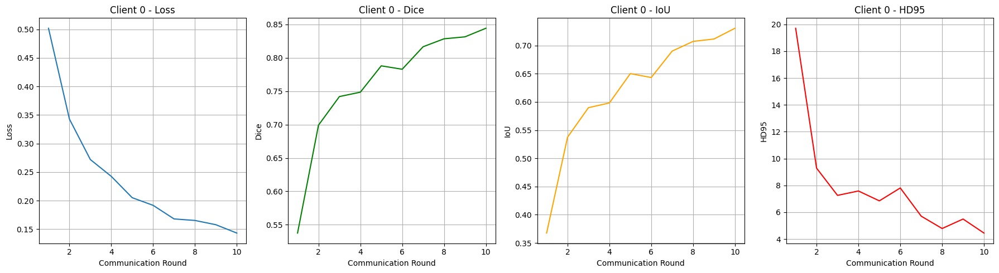

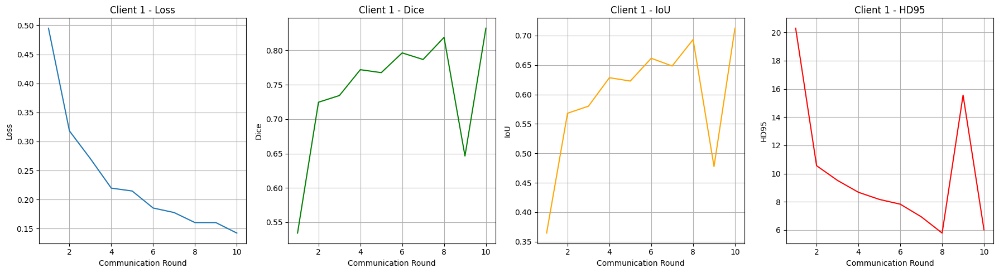

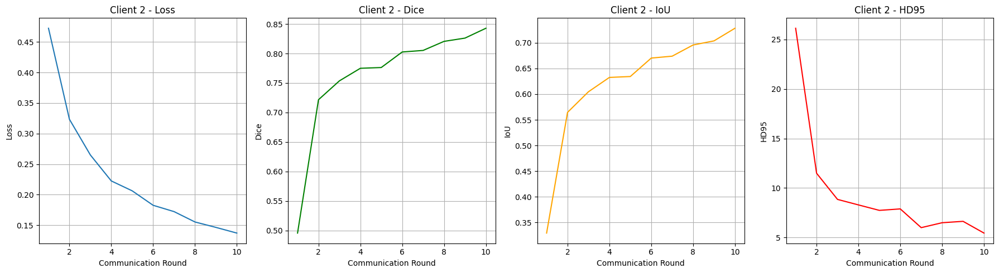

In [75]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

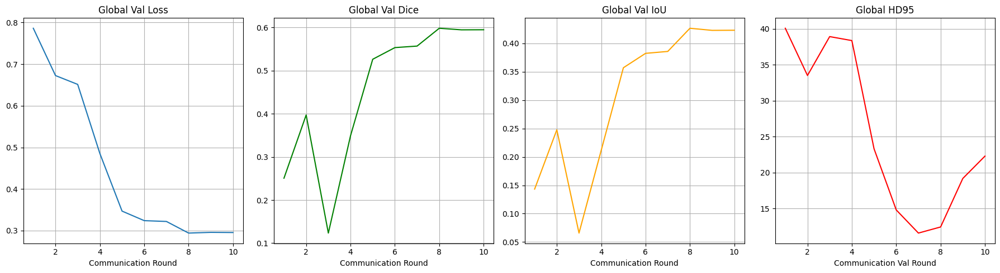

In [76]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [77]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_20112\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)

Testing:  46%|████▌     | 23/50 [00:05<00:05,  4.78it/s, Dice=0.4893, IoU=0.3239, HD95=13.7661]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing:  54%|█████▍    | 27/50 [00:06<00:05,  4.20it/s, Dice=0.4312, IoU=0.2749, HD95=14.9106]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:11<00:00,  4.48it/s, Dice=0.5216, IoU=0.3528, HD95=12.8669]


Test Set Metrics:
Dice: 0.5216
IoU: 0.3528
HD95: 12.8669


**Visualize**

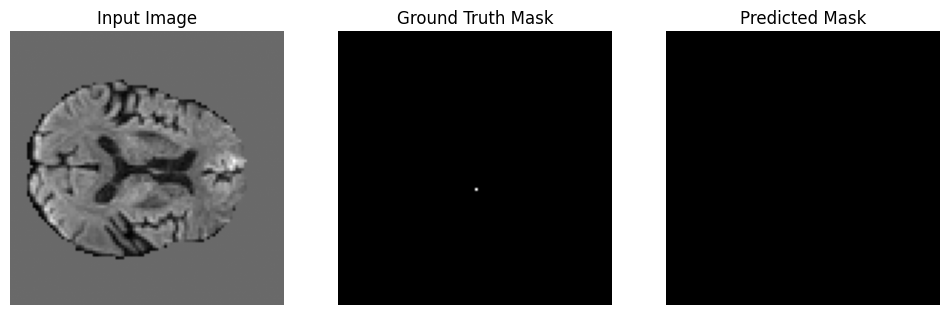

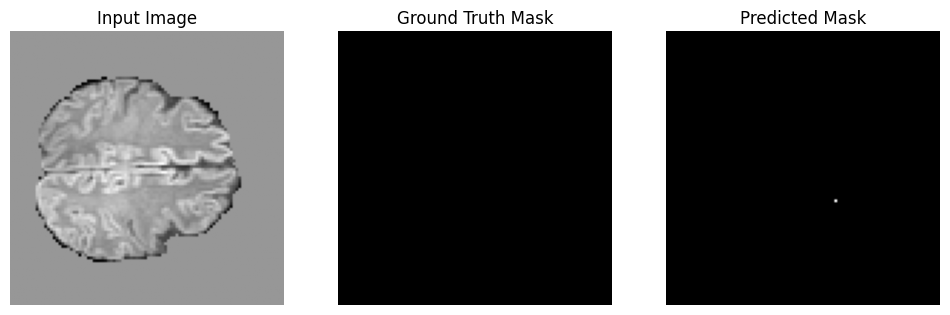

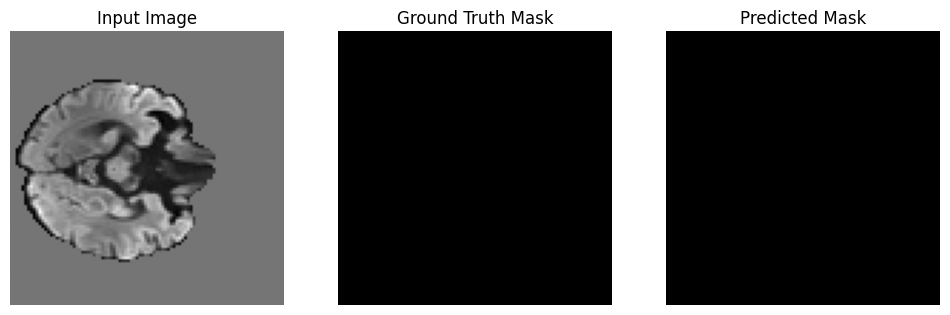

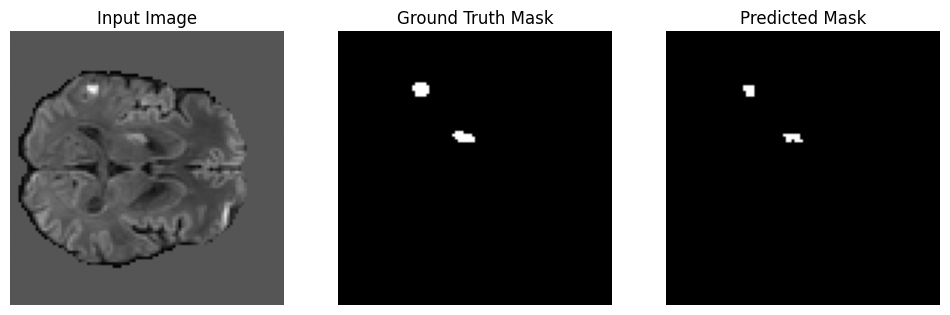

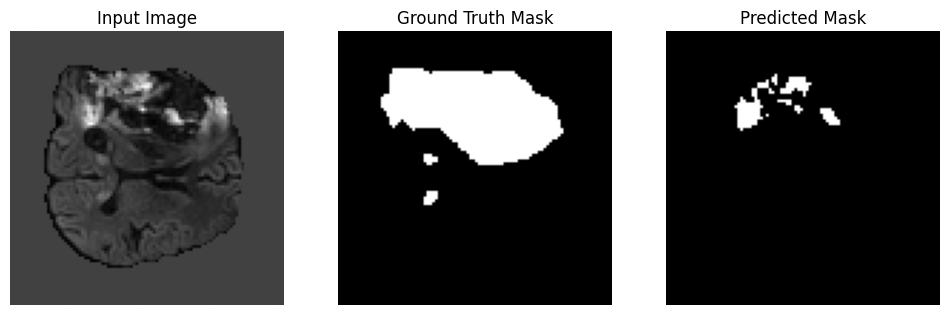

...

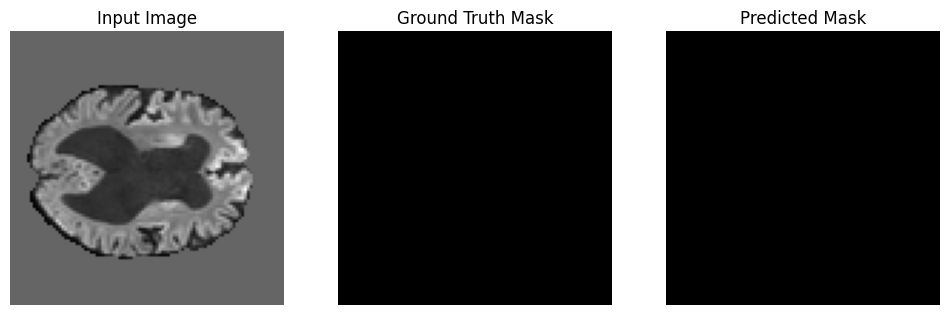

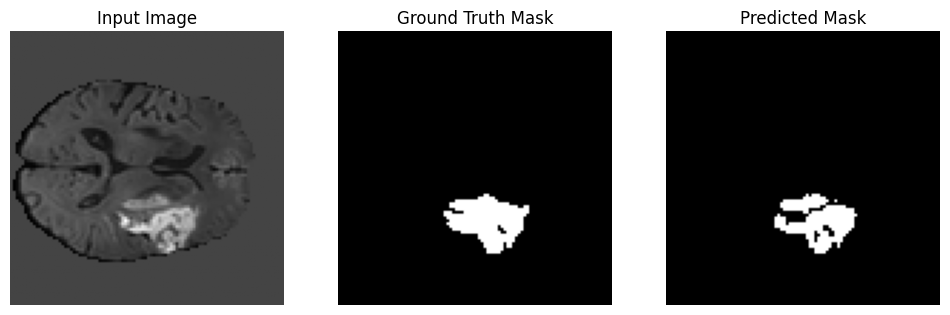

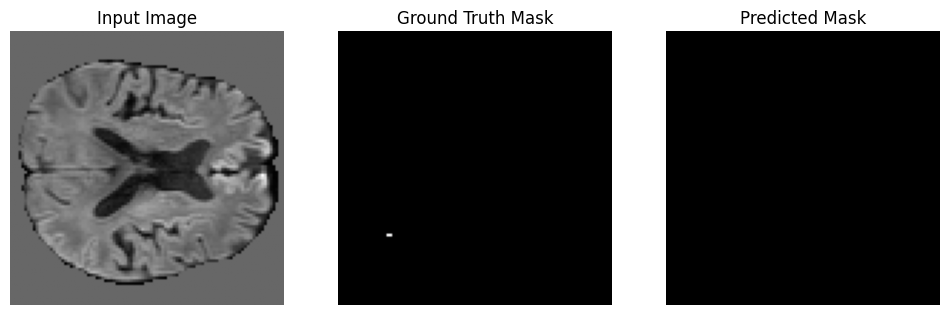

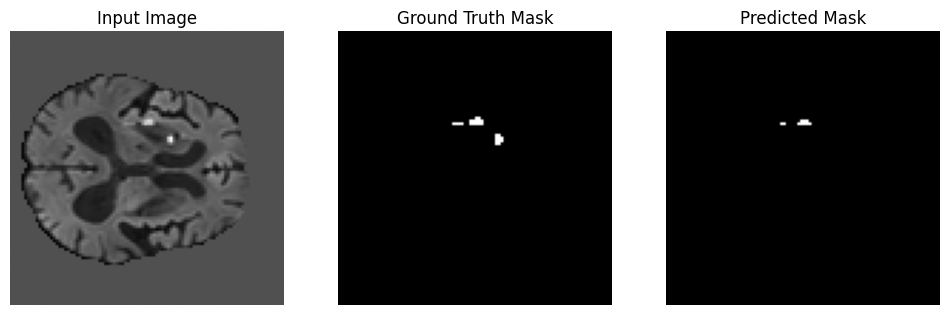

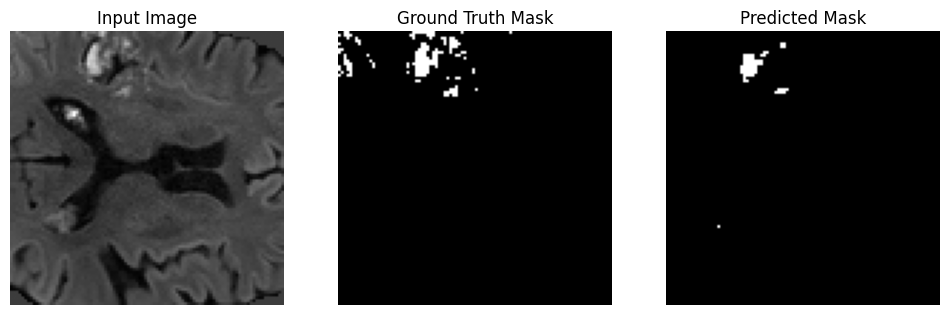

In [78]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()